# CIS6800: Project 6: SegFormer

### Instructions:
* This is a group assignment with one submission per group. It is expected that each member of the group will contribute to solving each question. Be sure to specify your teammates when you submit to Gradescope! Collaborating with other groups is not permitted.
* There is no single answer to most problems in deep learning, therefore the questions will often be underspecified. You need to fill in the blanks and submit a solution that solves the (practical) problem. Document the choices (hyperparameters, features, neural network architectures, etc.) you made where specified.
* All the code should be written in Python.
* You may include any code used in previous projects.

## Introduction

SegFormer is a simple architecture with some key innovations that allow it to acheive state of the art performance at much higher speeds and fewer parameters than other competing methods. In this assignment, you will be implementing the building blocks of SegFormer. An overview of the architecture is provided below. 

It is highly encouraged for you to review the SegFormer paper, available [here](https://arxiv.org/pdf/2105.15203.pdf). In particular, Section 3 contains detailed descriptions of the modules you will be implementing.

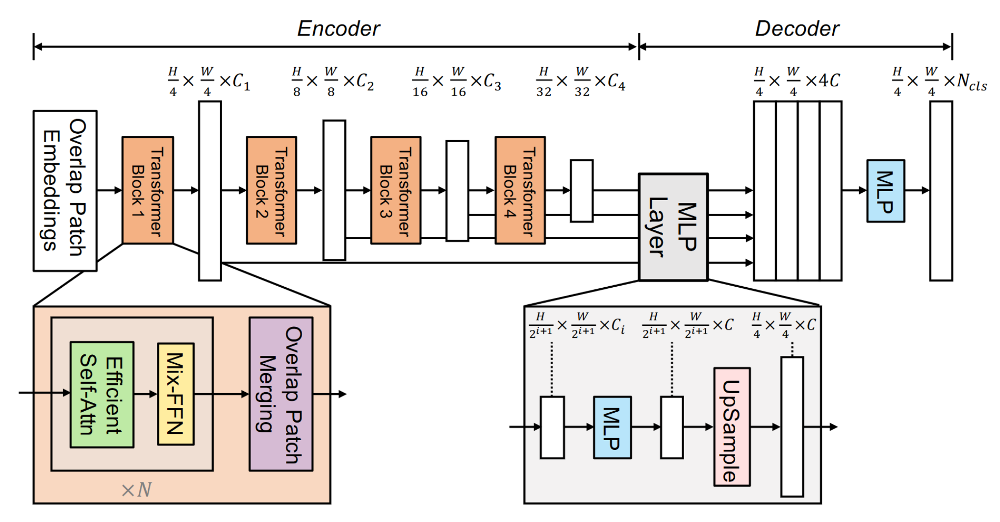 

In [1]:
!pip install pytorch-lightning torchbench

import torch
from torch import nn
import numpy as np
import pytorch_lightning as pl
from torchbench.datasets import ADE20K
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_tensor, pil_to_tensor, resize, normalize
from torchvision.transforms import InterpolationMode
from torch.utils.data import Subset, DataLoader
from tqdm import tqdm

## Data
For this assignment, we will use a simplified subset of ADE20K containg approximately 11,000 images with only four classes: "plant", "person/animal", "vehicle", and "background". The data in composed of a semantic class for each pixel - there is no distinction between different instances of the same object, unlike in previous assignments.

The following code downloads the original dataset, processes it, and visualizes an example.

In [2]:
def simple_ade20k_transforms(image, target):
    image = resize(to_tensor(image), (256, 256))
    image = normalize(image, [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    target = resize(pil_to_tensor(target), (64, 64), InterpolationMode.NEAREST)[0].long()
    # 0: background, -1: plant, -2: person/animal, -3: vehicle
    class_mapping = [(5, -1), (10, -1), (13, -2), (18, -1), (21, -3), (67, -1), 
                     (77, -3), (84, -3), (91, -3), (103, -3), (104, -3), (127, -2), (128, -3)]
    for cm in class_mapping:
        target[target == cm[0]] = cm[1]
    target[target > 0] = 0
    target *= -1
    return image, target

In [3]:
train_dataset = ADE20K('data', 'train', download=True, transforms=simple_ade20k_transforms)
val_dataset = ADE20K('data', 'val', transforms=simple_ade20k_transforms)

You set download=True, but a folder VOCdevkit already exist in the root directory. If you want to re-download or re-extract the archive, delete the folder.


In [4]:
def trim_dataset(dataset):
    valid_indices = []
    for entry in tqdm(range(len(dataset))):
        _, target = dataset[entry]
        if (target > 0).float().mean() > 0.01:
            valid_indices.append(entry)
    if len(dataset) > len(valid_indices):
        dataset = Subset(dataset, valid_indices)
    return dataset

train_dataset = trim_dataset(train_dataset)
val_dataset = trim_dataset(val_dataset)

  0%|          | 0/20210 [00:00<?, ?it/s]

c:\Users\shreh\miniconda3\envs\pytorch_env\Lib\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
100%|██████████| 2000/2000 [00:43<00:00, 45.60it/s]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


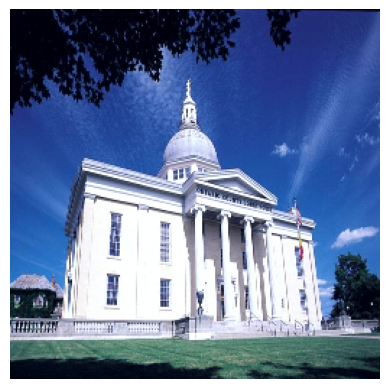

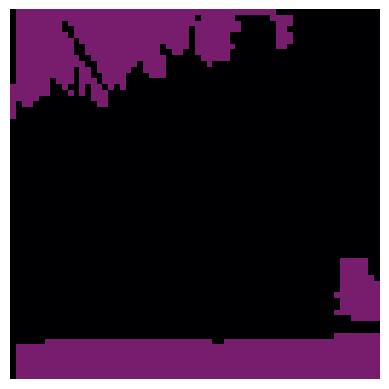

In [5]:
idx = 2453
plt.imshow(train_dataset[idx][0].permute(1, 2, 0) / 4 + 0.5) # just for visualization
plt.axis('off')
plt.show()
plt.imshow(train_dataset[idx][1], vmin=0, vmax=3, cmap='inferno')
plt.axis('off')
plt.show()

## Modules
For this section, you will have to implement the base functionalities and modules for the SegFormer. As illustrated in the **Figure 2** and **Section 3** in the paper, we divide SegFormer into encoder-decoder sections. The encoder mainly consists of multiple layers of MixTransformerEncoderLayer, which then consists of OverlapPatchMergiing + (EfficientSelfAttention + MixFFN). While patch merging is relatively intuitive, you have to implement EfficientSelfAttention following **Equation 1** in the paper, and MixFFN as illustrated in **Equation 3**. On the other hand, the decoder section also consists of multiple decoder blocks, ending with a MLP. Refer to **Equation 4** for this part.

In [6]:
from einops import rearrange
from torch import nn

class LayerNorm2d(nn.LayerNorm):
    def forward(self, x):
        x = rearrange(x, "b c h w -> b h w c")
        x = super().forward(x)
        x = rearrange(x, "b h w c -> b c h w")
        return x

In [7]:
# Combine adjacent patches to reduce feature map size, followed by LayerNorm
# Hint, patch merging can be accomplished with a single Conv2D module
class OverlapPatchMerging(nn.Module):
    def __init__(self, in_channels, out_channels, patch_size, stride, padding):
        super().__init__()
        super(OverlapPatchMerging, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=patch_size, stride=stride, padding=padding, bias=False)
        #self.layer_norm = nn.LayerNorm([out_channels, out_channels*2, out_channels*2])
        self.layer_norm = LayerNorm2d(out_channels)

    def forward(self, patches):
        """Merge patches to reduce dimensions of input.

        :param patches: tensor with shape (B, C, H, W) where
            B is the Batch size
            C is the number of Channels
            H and W are the Height and Width
        :return: tensor with shape (B, C, H, W)
        """
        # Apply convolution to merge adjacent patches
        #print(patches.shape)
        x = self.conv(patches)

        # Apply Layer Normalization
        x = self.layer_norm(x)
        #print(x.shape)
        return x

In [8]:
import torch.nn.functional as F

In [9]:
# Perform attention with a reduced set of keys
# Hint, use a Linear layer followed by a LayerNorm before passing into MultiheadAttention
class EfficientSelfAttention(nn.Module):
    def __init__(self, channels, reduction_ratio, num_heads):
        super().__init__()
        assert channels % num_heads == 0, f"channels {channels} should be divided by num_heads {num_heads}."

        # # Linear layer to reduce the number of keys
        # self.linear_reduce = nn.Linear(channels*2, channels // reduction_ratio)

        # # Layer normalization
        # self.layer_norm = nn.LayerNorm(channels // reduction_ratio)

        # self.num_heads = num_heads
        # self.d_head = channels // num_heads

        # # Learnable parameter for scaling
        # self.scaling = nn.Parameter(torch.sqrt(torch.tensor(self.d_head, dtype=torch.float32)))


        self.reducer = nn.Sequential(
            nn.Conv2d(
                channels, channels, kernel_size=reduction_ratio, stride=reduction_ratio
            ),
            LayerNorm2d(channels),
        )
        self.att = nn.MultiheadAttention(
            channels, num_heads=num_heads, batch_first=True
        )

    def forward(self, x):
        """ Perform self attention with reduced sequence length

        :param x: tensor of shape (B, N, C) where
            B is the batch size,
            N is the number of queries (equal to H * W)
            C is the number of channels
        :return: tensor of shape (B, N, C)
        """
        #print('x', x.shape)
        
        # q = self.linear_q(x)
        # k = self.linear_k(x)
        # v = self.linear_v(x)

        # # Layer normalization for Q, K, and V
        # q_normed = self.layer_norm(q)
        # k_normed = self.layer_norm(k)
        # v_normed = self.layer_norm(v)
        
        # print(q_normed.shape)
        # print(k_normed.shape)
        # # Compute attention scores with the specific formula
        # attention_scores = torch.matmul(q_normed, k_normed.transpose(2,3)) / self.scaling

        # # Apply softmax to get attention weights
        # attention_weights = F.softmax(attention_scores, dim=-1)

        # # Apply attention weights to values
        # attended_output = torch.matmul(attention_weights, v_normed)
        # print(attended_output.shape)

        # # Add the attended output to the input (residual connection)
        # attended_output = self.expand(attended_output)
        # output = x + attended_output
        #print(x.shape)
        _, _, h, w = x.shape
        reduced_x = self.reducer(x)
        # attention needs tensor of shape (batch, sequence_length, channels)
        reduced_x = rearrange(reduced_x, "b c h w -> b (h w) c")
        y = rearrange(x, "b c h w -> b (h w) c")
        out = self.att(y, reduced_x, reduced_x)[0]
        # reshape it back to (batch, channels, height, width)
        out = rearrange(out, "b (h w) c -> b c h w", h=h, w=w)
        #print(out.shape)
        return out+x

In [10]:
# A feedforward network that mixes spatial information
# Should implement the following structure (inverse bottleneck):
#     mlp (channels -> expanded_channels)
#     depth-wise convolution (3 x 3)
#     activation function (gelu)
#     mlp (expanded_channels -> channels)
class MixFFN(nn.Module):
    def __init__(self, channels, expansion_factor):
        super().__init__()
        
        super(MixFFN, self).__init__()

        # MLP (channels -> expanded_channels)
        # self.mlp1 = nn.Sequential(
        #     nn.Conv2d(channels, channels * expansion_factor, kernel_size=1),
        #     nn.ReLU(inplace=True)
        # )
        self.mlp1 = nn.Conv2d(channels, channels, kernel_size=1)
        # Depth-wise convolution (3 x 3)
        self.depthwise_conv = nn.Conv2d(channels, channels * expansion_factor, kernel_size=3, padding=1, groups=channels)

        # Activation function (GELU)
        self.gelu = nn.GELU()

        # MLP (expanded_channels -> channels)
        # self.mlp2 = nn.Sequential(
        #     nn.Conv2d(channels * expansion_factor, channels, kernel_size=1),
        #     nn.ReLU(inplace=True)
        # )
        self.mlp2 = nn.Conv2d(channels * expansion_factor, channels, kernel_size=1)

    def forward(self, x):
        """ Perform self attention with reduced sequence length

        :param x: tensor with shape (B, C, H, W) where
            B is the Batch size
            C is the number of Channels
            H and W are the Height and Width
        :return: tensor with shape (B, C, H, W)
        """
        #print('xini', x.shape)
        out = self.mlp1(x)

        # Depth-wise convolution (3 x 3)
        out = self.depthwise_conv(out)

        # Activation function (GELU)
        out = self.gelu(out)

        # MLP (expanded_channels -> channels)
        out = self.mlp2(out)

        # Add the output to the input (residual connection)
        #out = x + out
        #print(out.shape)
        return out + x
        return x

In [11]:
# Combine patch merging with n_layers of [attention followed by ffn]
class MixTransformerEncoderLayer(nn.Module):
    def __init__(self, in_channels, out_channels, patch_size, stride, padding, 
                 n_layers, reduction_ratio, num_heads, expansion_factor):
        super().__init__()
        

        super(MixTransformerEncoderLayer, self).__init__()

        # Patch merging
        self.patch_merging = OverlapPatchMerging(in_channels, out_channels, patch_size, stride, padding)

        # List to hold the attention and feedforward layers
        self.layers = nn.ModuleList([
            LayerNorm2d(out_channels),
            EfficientSelfAttention(out_channels, reduction_ratio, num_heads),
            LayerNorm2d(out_channels),
            MixFFN(out_channels, expansion_factor)] * n_layers)
        self.norm = LayerNorm2d(out_channels)

    def forward(self, x):
        """ Run one block of the mix vision transformer

        :param x: tensor with shape (B, C, H, W) where
            B is the Batch size
            C is the number of Channels
            H and W are the Height and Width
        :return: tensor with shape (B, C, H, W)
        """
        #print('xini', x.shape)
        x = self.patch_merging(x)

        # Iterate through attention and feedforward layers
        for layer in self.layers:
            x = layer(x)
        #print(x.shape)
        x = self.norm(x)
        return x

In [12]:
# Merge multiple feature maps and produce predictions
# Should implement the following structure
#     mlp_i (in_channels -> embed_channels)
#     usample and concatenate
#     mlp (m * embed_channels -> embed_channels)
#     batch norm and relu
#     mlp (embed_channels -> num_classes)
class MLPDecoder(nn.Module):
    def __init__(self, in_channels, embed_channels, out_dims, num_classes):
        """Initialize MLP Decoder.
        :param in_channels: list of int, number of input channels for each layeer
        :param embed_channels: int, common embedding channels
        :param out_dims: tuple, dimensions of common feature map
        """
        super().__init__()
        

        super(MLPDecoder, self).__init__()

        #self.encoder = MixTransformerEncoderLayer()

        # List of MLP layers
        self.mlp_layers = nn.ModuleList([nn.Sequential(
            nn.Conv2d(in_ch, embed_channels, kernel_size=1)
        ) for in_ch in in_channels])
        
        
        # Upsample and concatenate
        self.upsample_concat = nn.Sequential(
            #nn.Upsample(size=out_dims, mode='bilinear', align_corners=False),
            nn.Conv2d(len(in_channels) * embed_channels, embed_channels, kernel_size=1)
        )

        # Batch norm and ReLU
        self.batch_norm_relu = nn.Sequential(
            nn.BatchNorm2d(embed_channels),
            nn.ReLU(inplace=True)
        )

        # Final MLP layer
        self.final_mlp = nn.Conv2d(embed_channels, num_classes, kernel_size=1)


    def forward(self, x):
        """ Take feature map to common shape
        :param x: list of tensors with shape (B, Ci, Hi, Wi)
            B is the Batch size
            Ci is the number of input Channels
            Hi and Wi are the input Height and Width
        :return: tensor with shape (B, C, H, W)
            B is the Batch size
            C is the number of output Channels
            H and W are the input Height and Width
        """
        mlp_outputs = [mlp_layer(feature_map) for mlp_layer, feature_map in zip(self.mlp_layers, x)]

        max_dims = max(output.shape[2:] for output in mlp_outputs)
        #print(max_dims)
        # Upsample each tensor to the maximum dimensions
        upsampled_outputs = [F.interpolate(output, size=max_dims, mode='bilinear', align_corners=False) for output in mlp_outputs]
        
        # Concatenate tensors along a new dimension (dimension=1)
        concatenated_outputs = torch.cat(upsampled_outputs, dim=1)
        
        upsampled_concatenated = self.upsample_concat(concatenated_outputs)

        #upsampled_outputs = [F.interpolate(output, size=mlp_outputs[-1].shape[2:], mode='bilinear', align_corners=False) for output in mlp_outputs]

# Concatenate tensors along the channel dimension
        #concatenated_outputs = torch.cat(upsampled_outputs + [mlp_outputs[-1]], dim=0)
        # Batch norm and ReLU
        #concatenated_outputs = self.upsample_concat(concatenated_outputs)
        batch_norm_relu_output = self.batch_norm_relu(upsampled_concatenated)

        # Final MLP layer
        output = self.final_mlp(batch_norm_relu_output)
        #print('x', x.shape)
        #print('output', output.shape)

        return output
        return x

## Model and Training
We have provided you with a near-complete network template which you can indicate how a complete SegFormer is structured and how it calls the modules we have built. For validation step, you need to implement mean IoU as paper suggests.

In [27]:
# This is implemented for you! Just implement the miou
losst = []
mio  = []
class SegFormer_B0(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.encoder_blocks = nn.ModuleList([
            MixTransformerEncoderLayer(3, 32, patch_size=7, stride=4, padding=3, n_layers=2, reduction_ratio=8, num_heads=1, expansion_factor=8),
            MixTransformerEncoderLayer(32, 64, patch_size=3, stride=2, padding=1, n_layers=2, reduction_ratio=4, num_heads=2, expansion_factor=8),
            MixTransformerEncoderLayer(64, 160, patch_size=3, stride=2, padding=1, n_layers=2, reduction_ratio=2, num_heads=5, expansion_factor=4),
            MixTransformerEncoderLayer(160, 256, patch_size=3, stride=2, padding=1, n_layers=2, reduction_ratio=1, num_heads=8, expansion_factor=4)
        ])
        self.decoder = MLPDecoder([32, 64, 160, 256], 256, (64, 64), 4)
        self.loss = nn.CrossEntropyLoss()
        self.train_loss = []
        self.mioup = []
        self.plot_loss = []
        self.plot_miou = []
    
    def forward(self, images):
        embeds = [images]
        for block in self.encoder_blocks:
            embeds.append(block(embeds[-1]))
        return self.decoder(embeds[1:])
        
    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=6e-5)
        return optimizer
    
    def miou(self, prediction, targets):
        #targets = targets.unsqueeze(1)
        #print(prediction.shape)
        #print(targets.shape)
        # if prediction.shape != targets.shape:
        #     raise ValueError("Shapes of prediction and targets must be the same.")

        # Get the number of classes (excluding background class)
        num_classes = prediction.shape[1]

        # Initialize variables to store intersection and union for each class
        intersection = torch.zeros(num_classes, device=prediction.device)
        union = torch.zeros(num_classes, device=prediction.device)
        #print('pred', prediction.shape)
        #print('targ', targets.shape)
        # Iterate over each class
        # for class_idx in range(num_classes):
        #     # Binary masks for the current class
        #     pred_mask = (prediction.argmax(dim=1) == class_idx).float()
        #     target_mask = (targets == class_idx).float()

        #     # Compute intersection and union
        #     intersection[class_idx] = torch.sum(pred_mask * target_mask)
        #     union[class_idx] = torch.sum(pred_mask) + torch.sum(target_mask) - intersection[class_idx]
        #print('pred', prediction)
        #print('targ', targets)
        iou=0.0
        for i in range(4):
            #Bools of the masks
            maskTar = targets == i
            #maskPred = prediction == i
            maskPred = prediction.argmax(dim=1) == i
            
            intersect = torch.logical_and(maskPred,maskTar).sum().item()
            union = torch.logical_or(maskPred, maskTar).sum().item()
            iou += intersect/(union+1e-6) 

        #Mean iou with valid classes
        iou=iou/4

        # Avoid division by zero
        #union = torch.where(union > 0, union, torch.ones_like(union))

        # Compute IoU for each class
        #iou = intersection / union

        # Compute mean IoU
        #mean_iou = torch.mean(iou)
        print('iou', iou)

        return iou

    def training_step(self, batch, batch_idx):
        images, targets = batch
        prediction = self.forward(images)
        loss = self.loss(prediction, targets)
        self.log('train_loss', loss, prog_bar=True)
        losst.append(loss)
        self.plot_loss.append(loss)
        return loss
    def on_train_epoch_end(self):
        average_train_loss = 0
        for i in range(len(self.plot_loss)):
            average_train_loss += self.plot_loss[i].detach().cpu().item()
        average_train_loss = average_train_loss/len(self.plot_loss)
        self.plot_loss.clear()
        self.train_loss.append(average_train_loss)
    
    def validation_step(self, batch, batch_idx):
        images, targets = batch
        prediction = self.forward(images)
        miou = self.miou(prediction, targets)
        mio.append(miou)
        self.plot_miou.append(miou)
        self.log('miou', miou, prog_bar=True)
    
    def on_validation_epoch_end(self):
        average_miou = 0
        for i in range(len(self.plot_miou)):
            average_miou += self.plot_miou[i]
        average_miou = average_miou/len(self.plot_miou)
        self.plot_miou.clear()
        self.mioup.append(average_miou)

In [31]:
model = SegFormer_B0()
train_loader = DataLoader(train_dataset, batch_size=32)
val_loader = DataLoader(val_dataset, batch_size=32)

In [ ]:
trainer = pl.Trainer(devices=1, accelerator="gpu", max_epochs=30)
trainer.fit(model, train_loader, val_loader)

In [ ]:
print(losst)
print(model.train_loss)
print(model.mioup)

In [34]:
torch.save(model, "model_full_lat.pth")

In [49]:
lis = [2,3,8,10,15,25,27,28,35,36,37,38,41,44,45,46,48,49,53,55,56,61,63,65,67,72,76,77,84,85,88,92,100,101,102]

## Results
Show your training curves and results on several images from the validation set. Provide a qualitative description of the performance of your model. Don't forget to upsample your predicted segmentation mask to the same resolution as the image! Segformer indeed has achieved great performance, there is a short demo on Cityspaces-C corrupted dataset on [YouTube](https://www.youtube.com/watch?v=J0MoRQzZe8U').

[0.7087033257491326, 0.5359744963618372, 0.5021975205382171, 0.48709558536207054, 0.474238717228691, 0.46312225235335397, 0.4520362519546051, 0.43993668486444937, 0.42821601033210754, 0.4171200031576129, 0.4060481745383643, 0.3946277706350894, 0.38210818834732035, 0.3691435290037552, 0.3557317940399826, 0.3427871722361945, 0.3324077195687101, 0.32200295714973715, 0.3136910373248117, 0.30338534260588573, 0.2945661785974668, 0.284816391981406, 0.27547350906998436, 0.26655010304096116, 0.26242169229625967, 0.25665464872397437, 0.2536530583407838, 0.246814364039829, 0.24080185079677946, 0.23512396212085823]


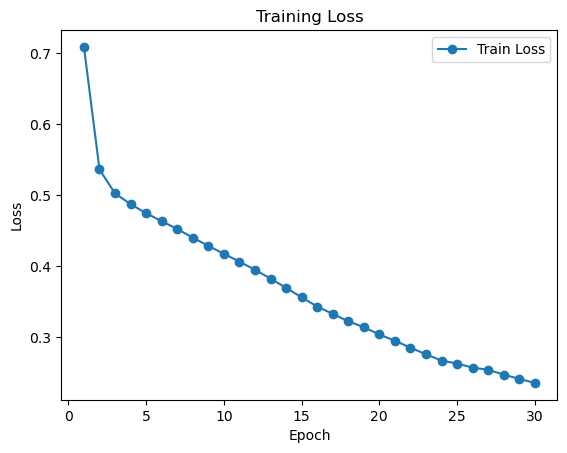

In [57]:
import matplotlib.pyplot as plt
import numpy as np

train_loss_values = model.train_loss
miou_values = model.mioup

print(train_loss_values)
epochs = np.arange(1, len(model.train_loss) + 1)

plt.plot(epochs, train_loss_values, label='Train Loss', marker='o')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()



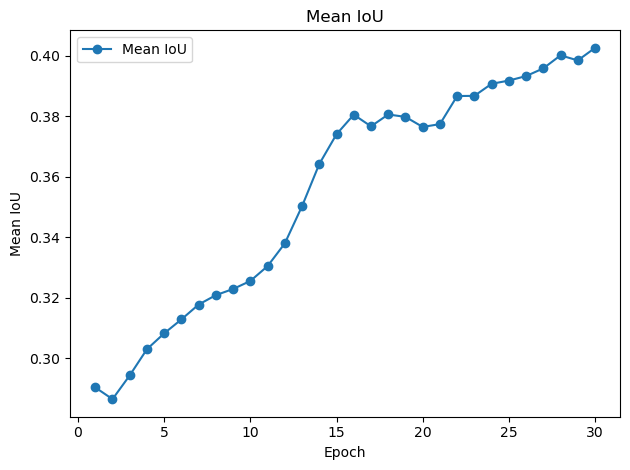

In [58]:
plt.plot(epochs, miou_values[1:], label='Mean IoU', marker='o')
plt.title('Mean IoU')
plt.xlabel('Epoch')
plt.ylabel('Mean IoU')
plt.legend()

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


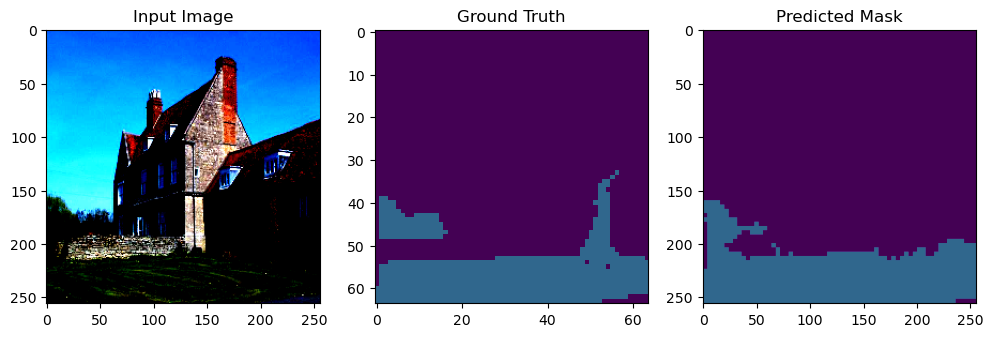

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


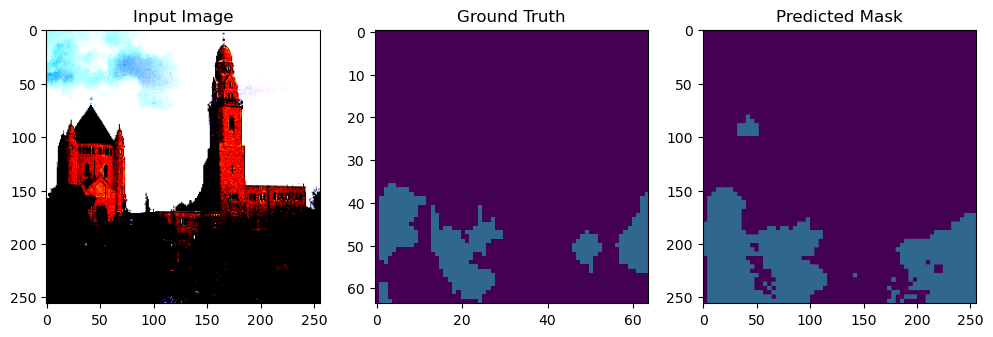

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


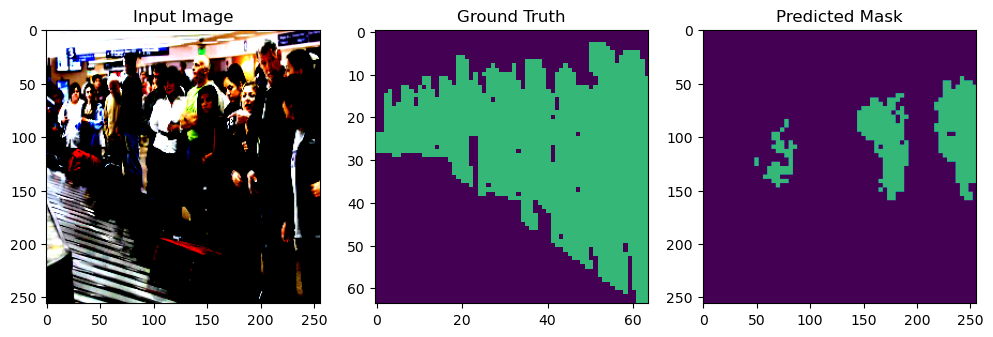

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


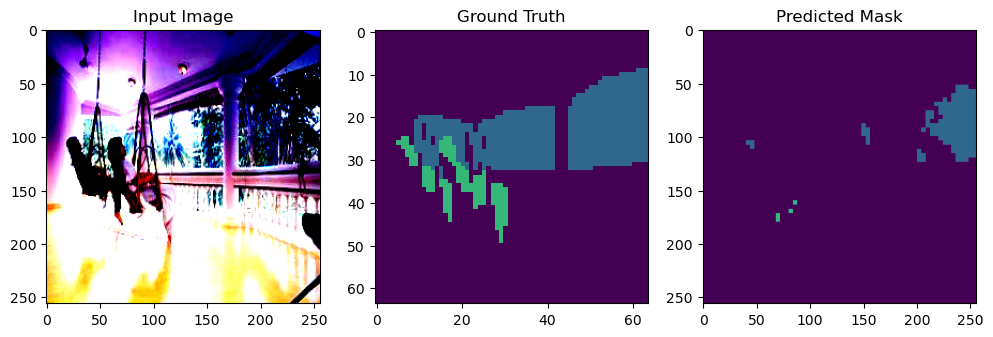

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


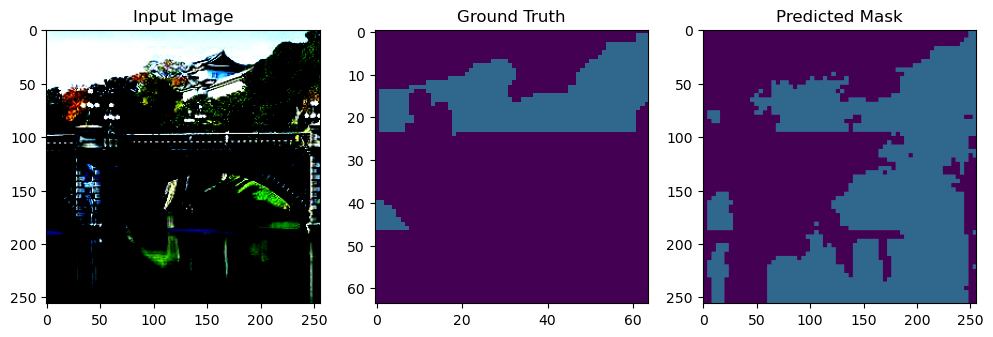

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


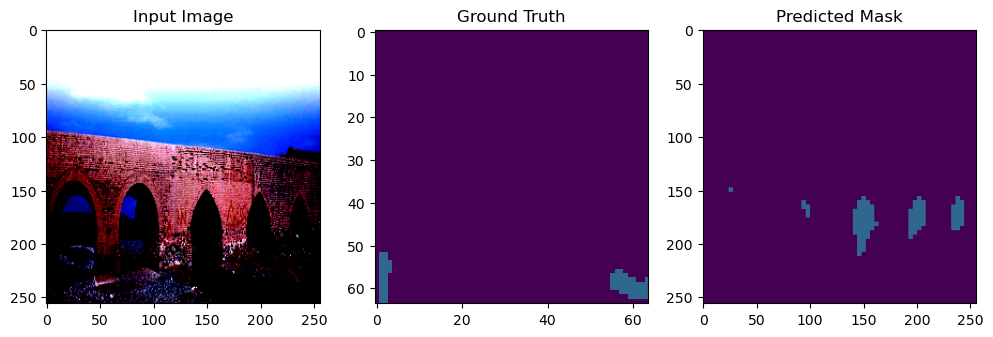

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


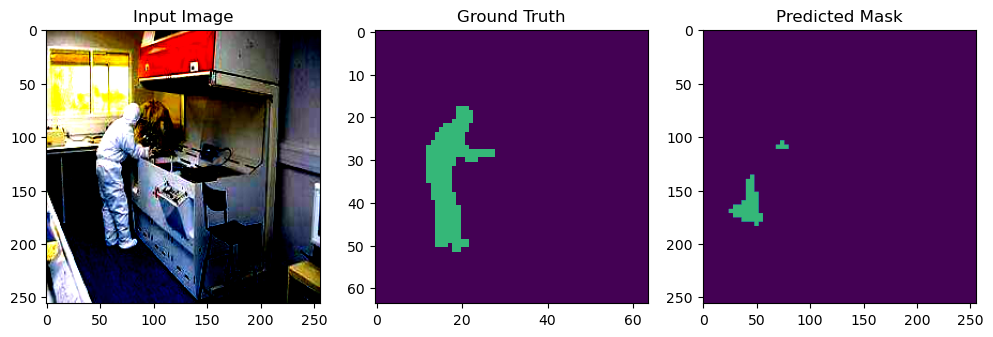

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


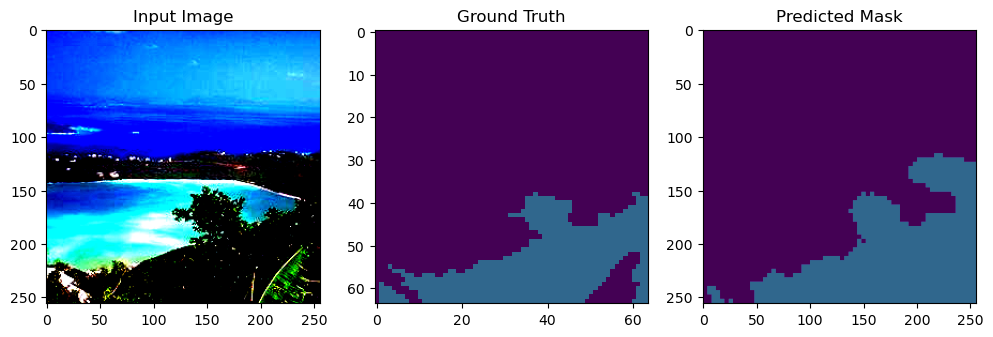

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


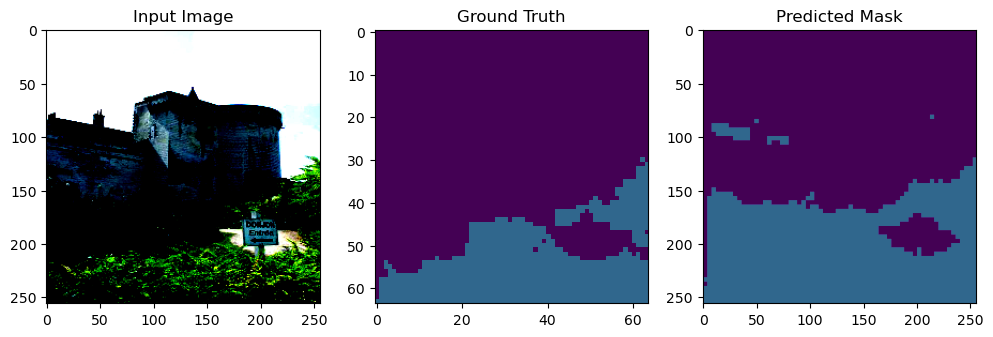

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


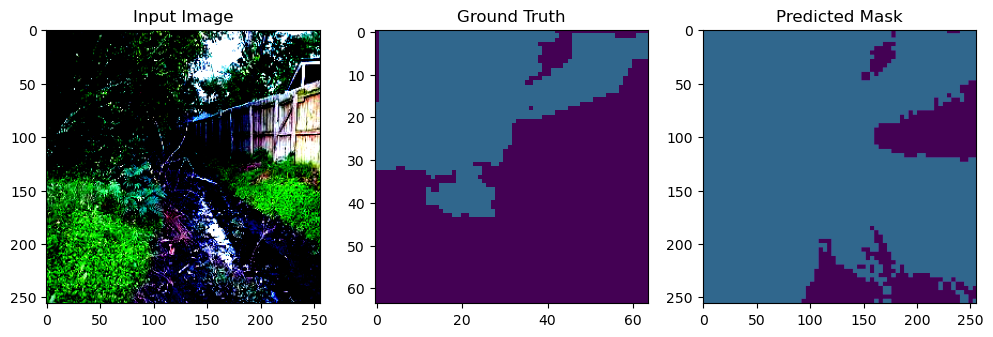

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


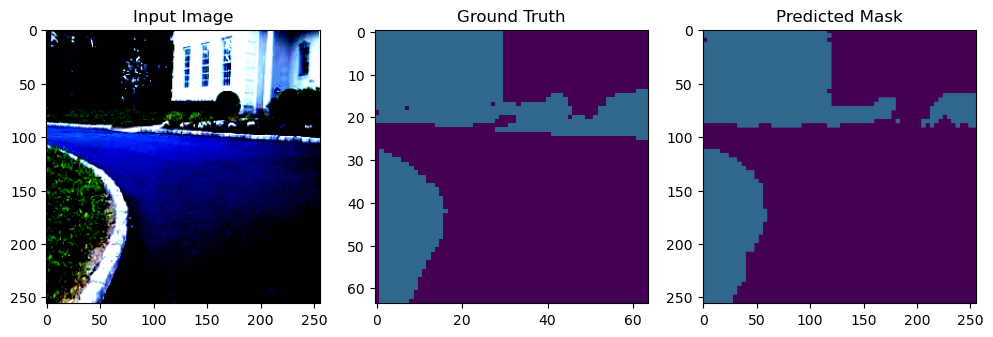

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


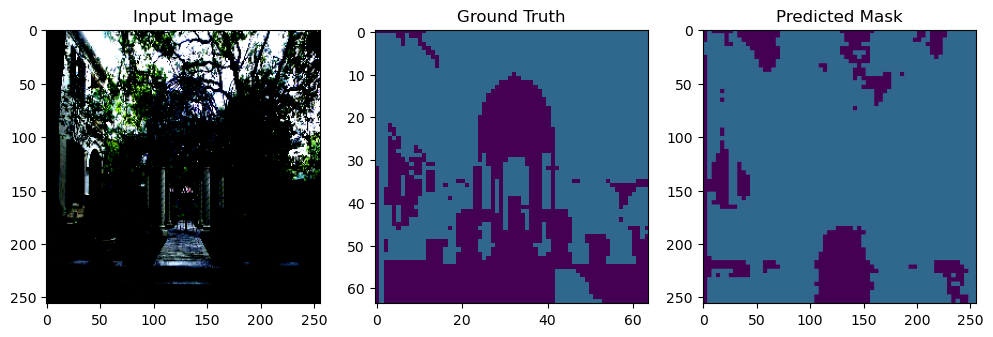

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


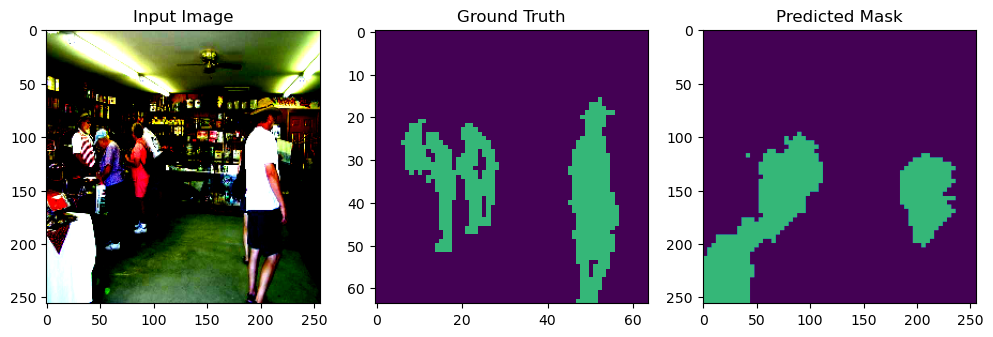

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


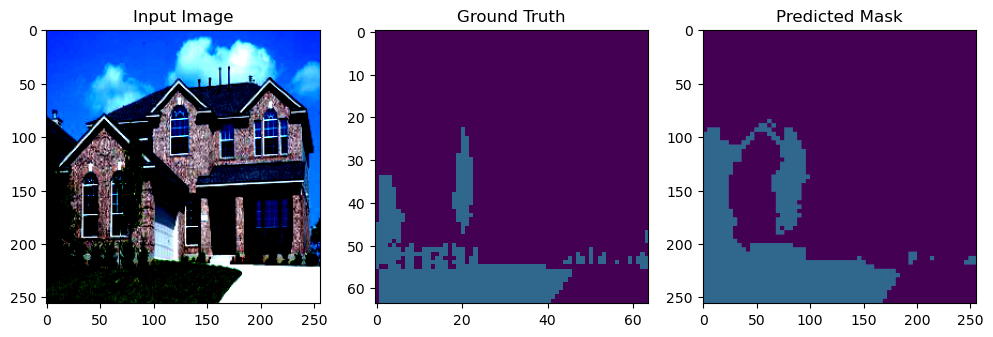

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


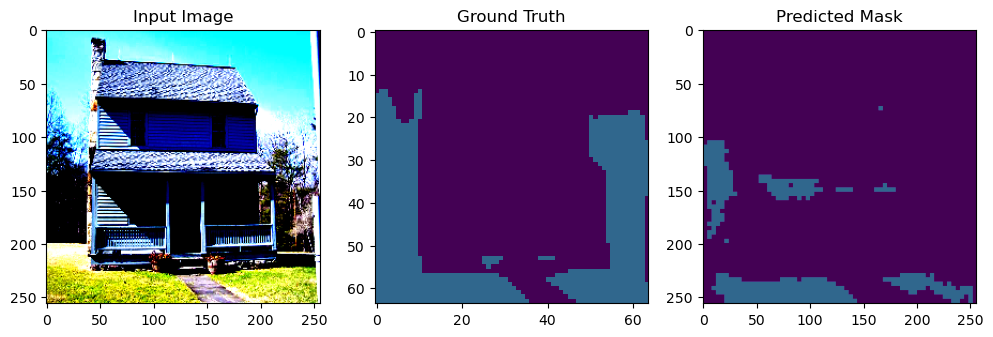

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


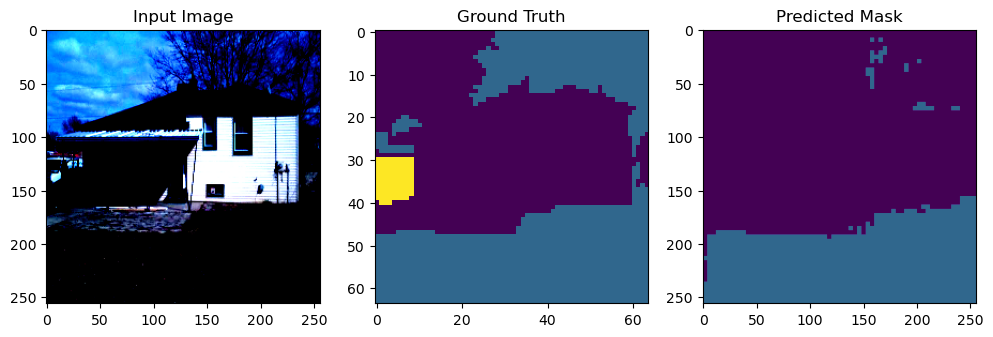

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


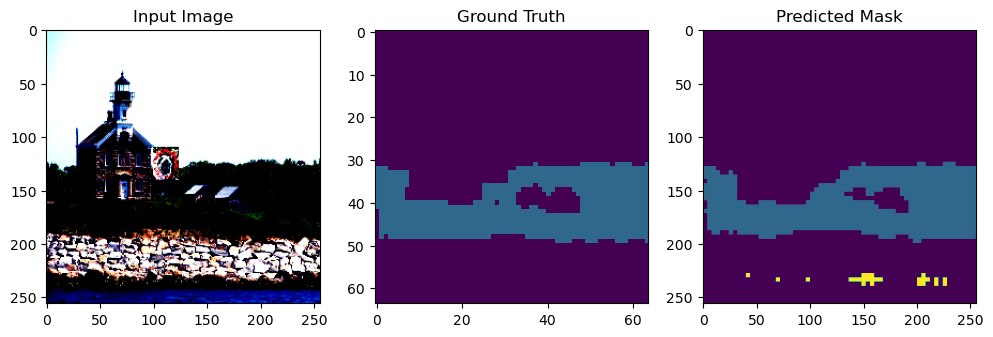

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


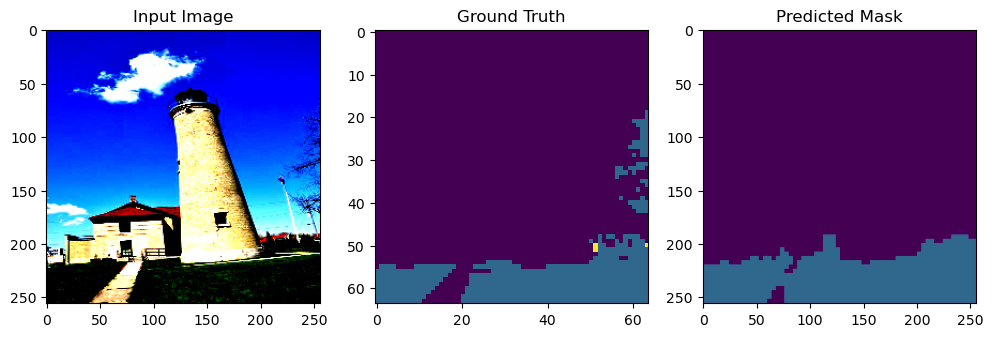

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


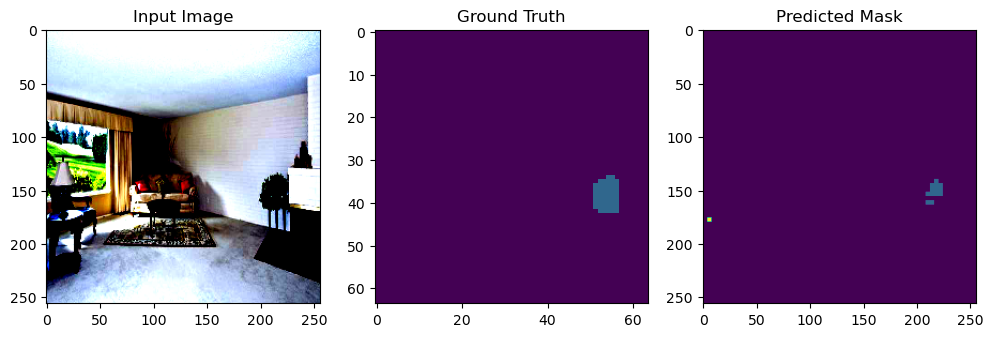

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


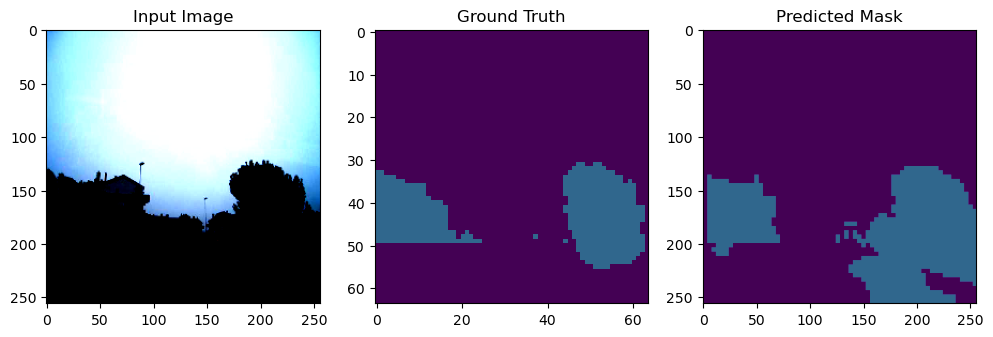

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


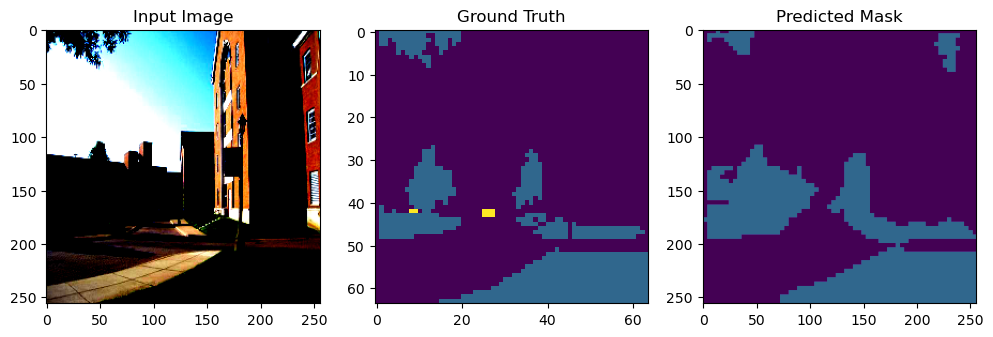

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


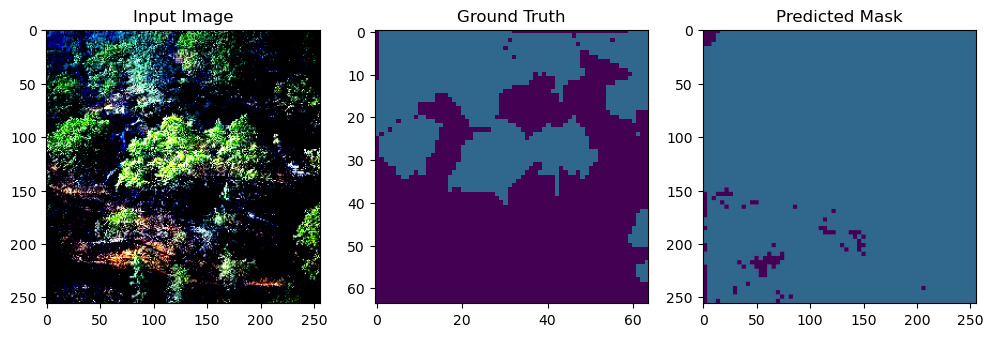

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


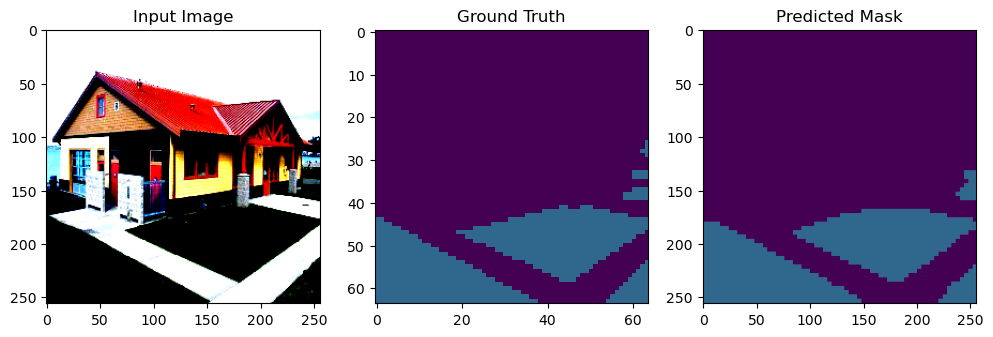

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


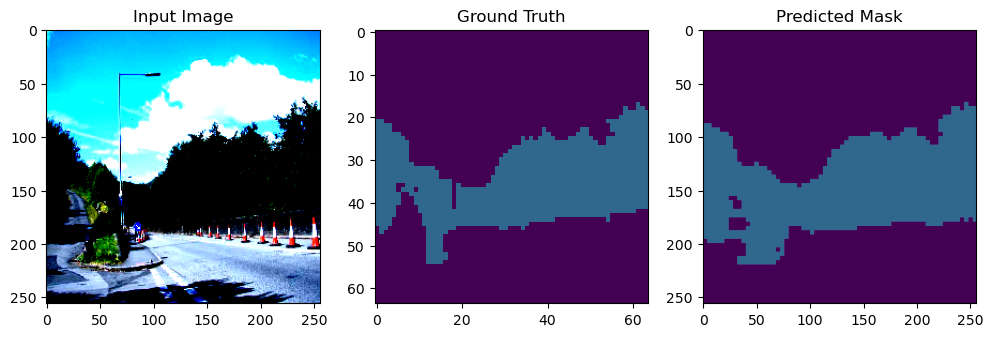

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


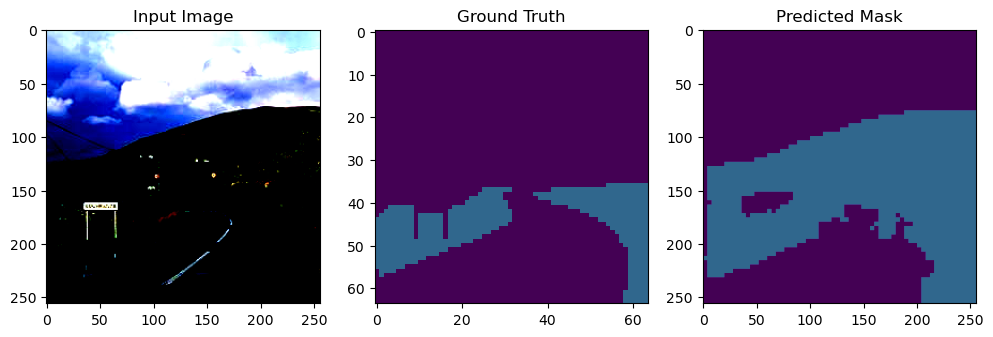

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


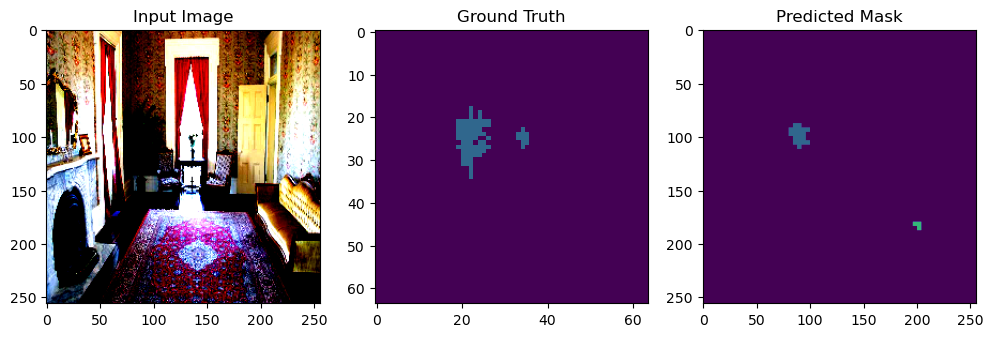

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


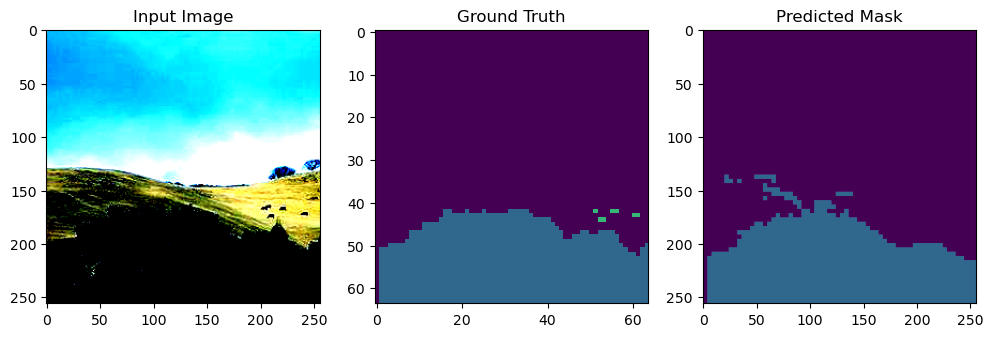

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


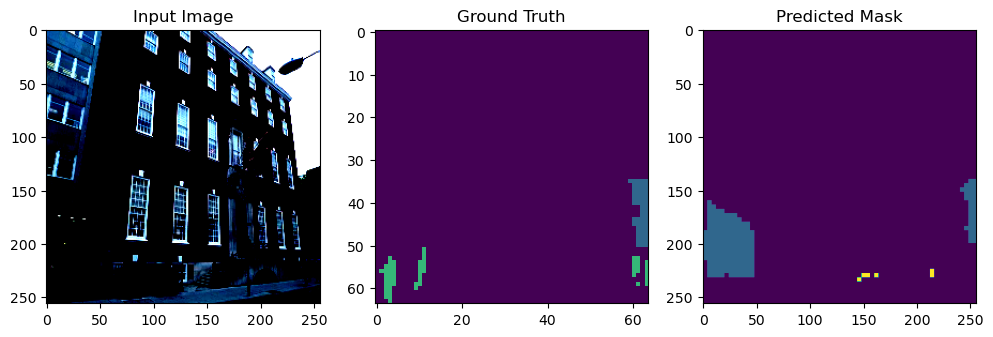

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


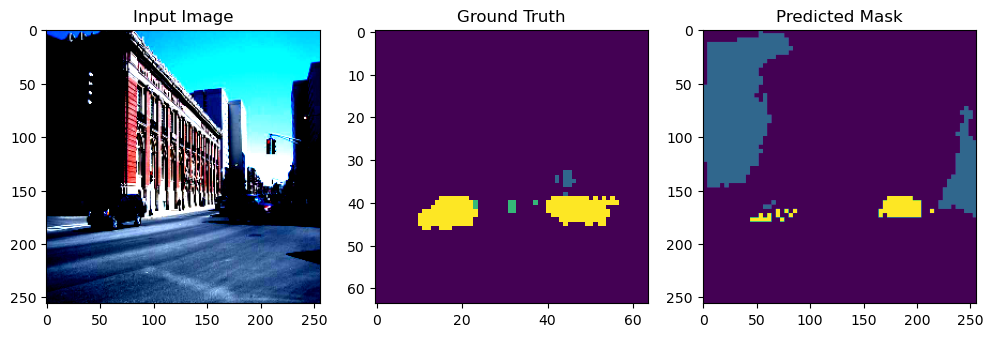

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


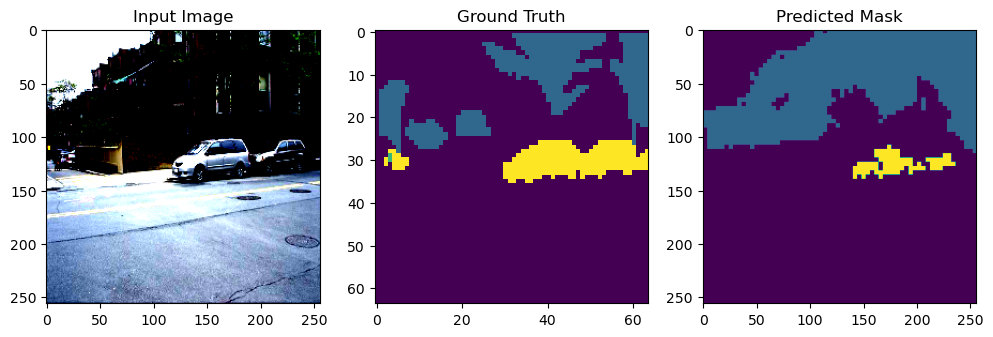

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


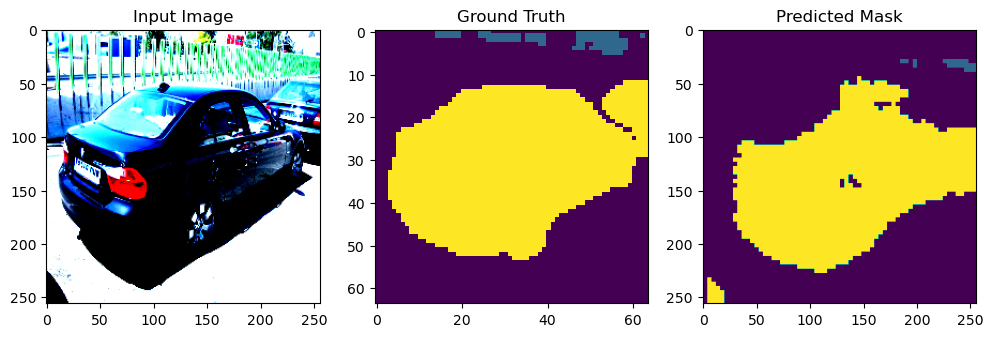

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


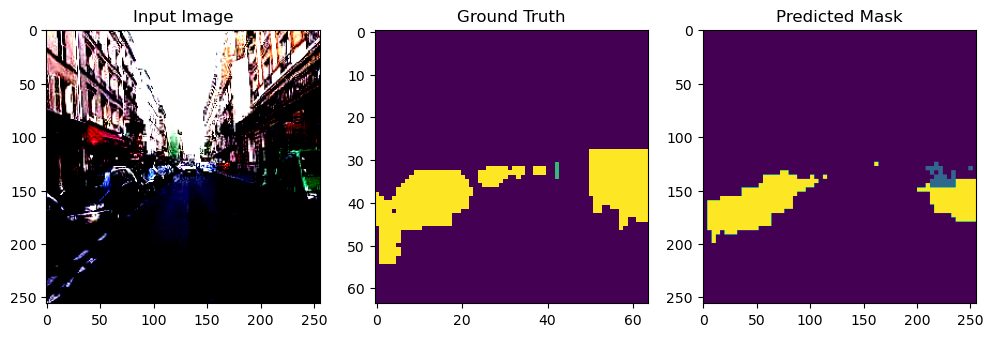

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


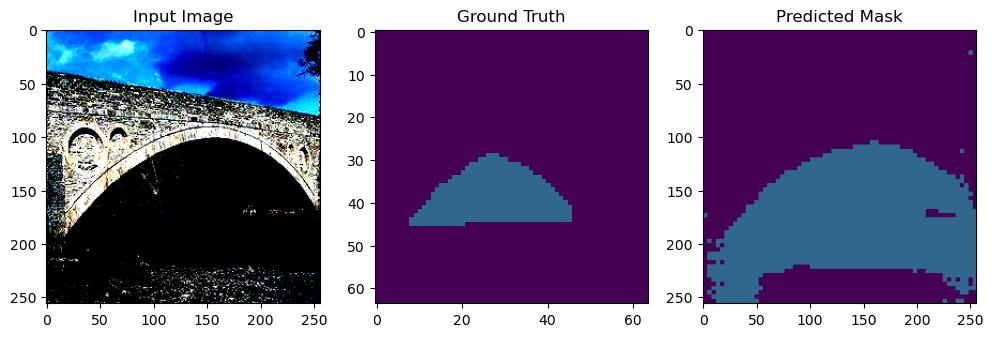

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


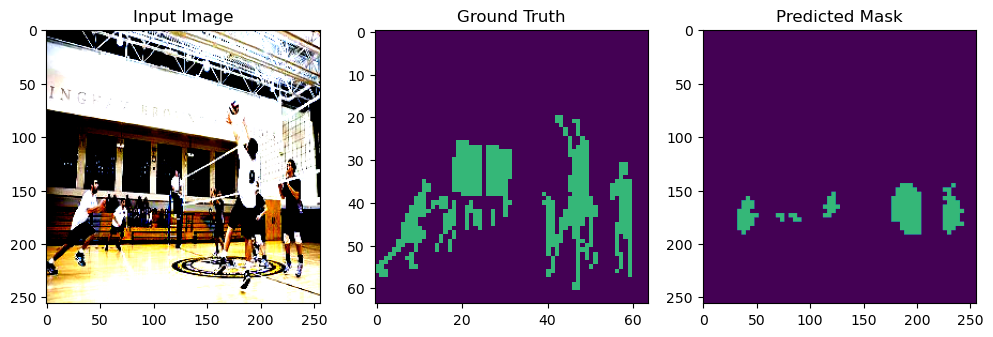

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


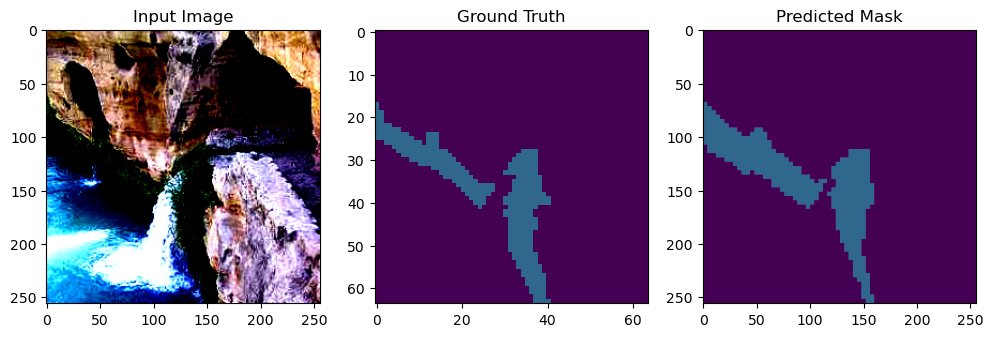

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


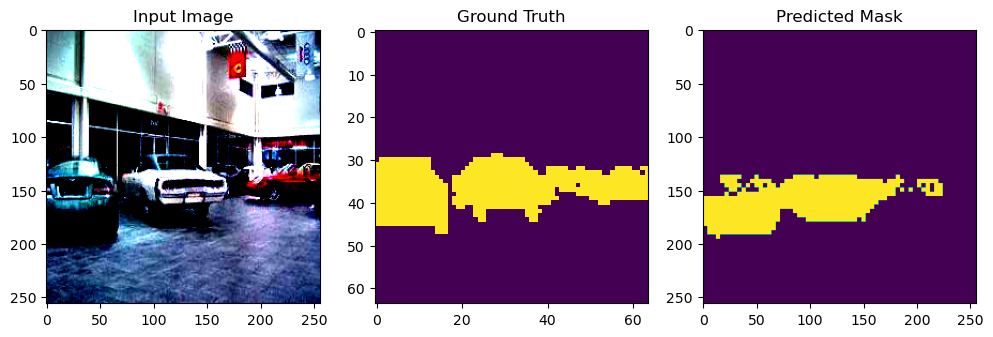

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


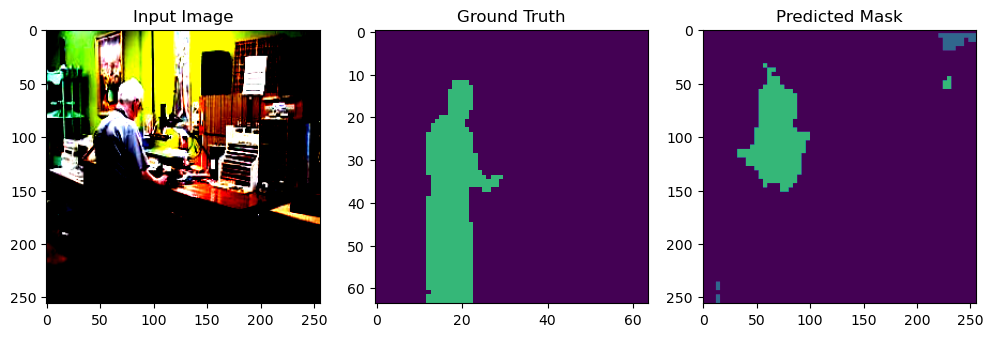

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


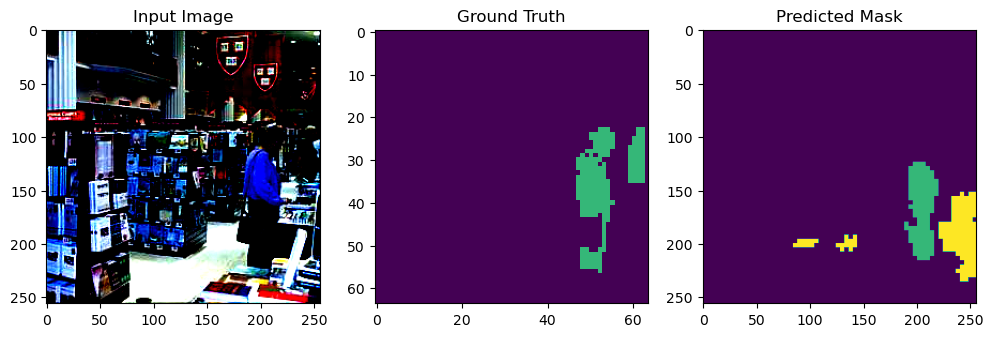

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


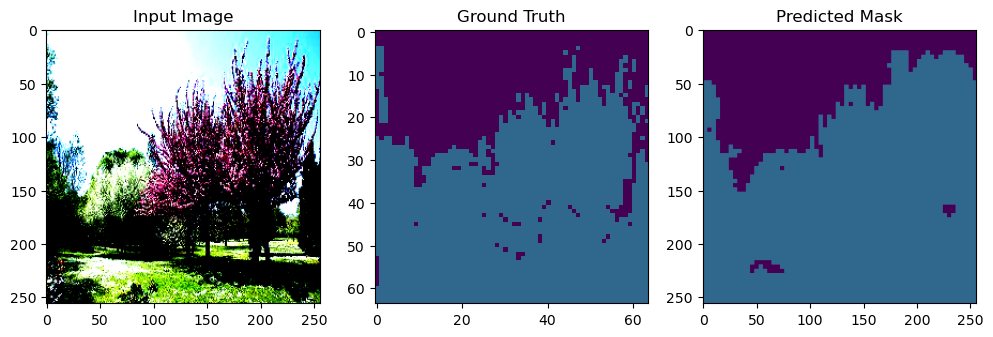

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


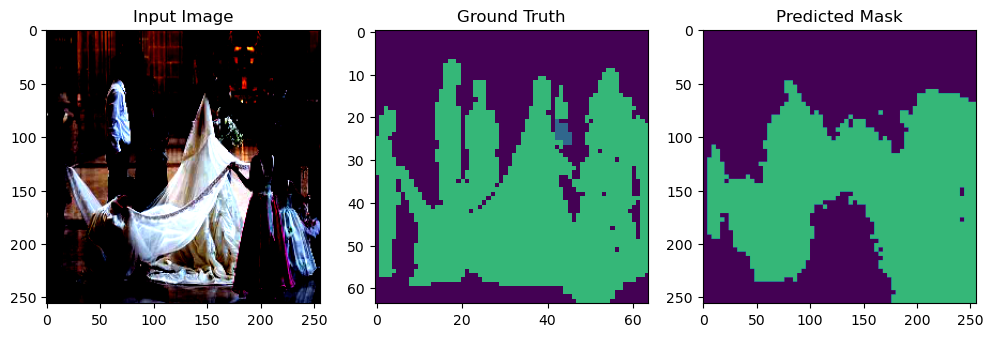

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


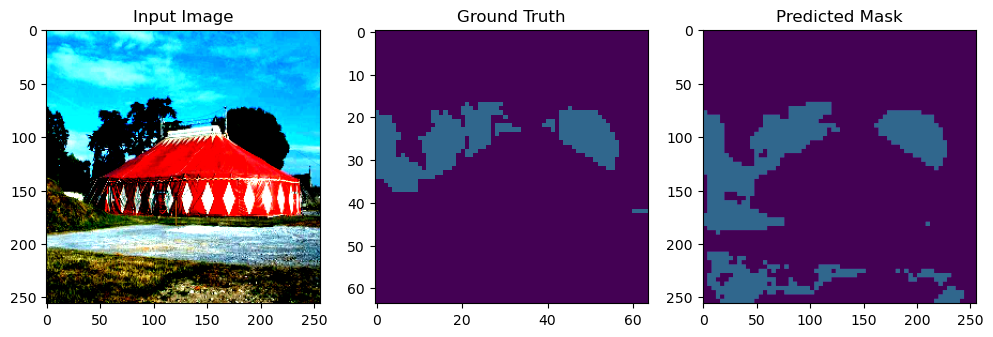

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


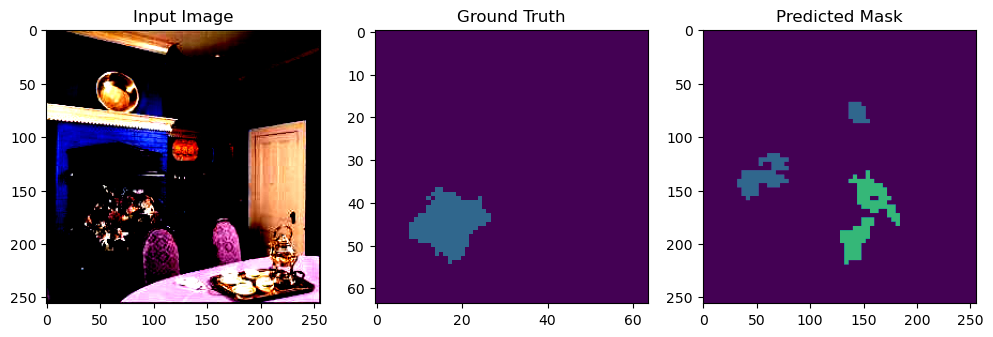

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


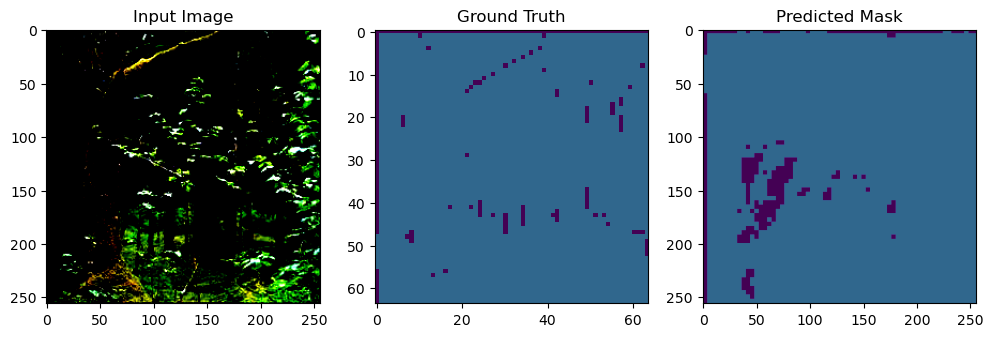

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


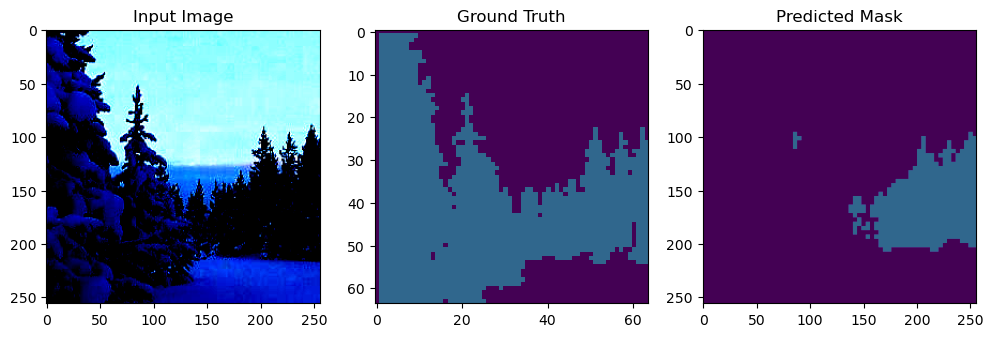

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


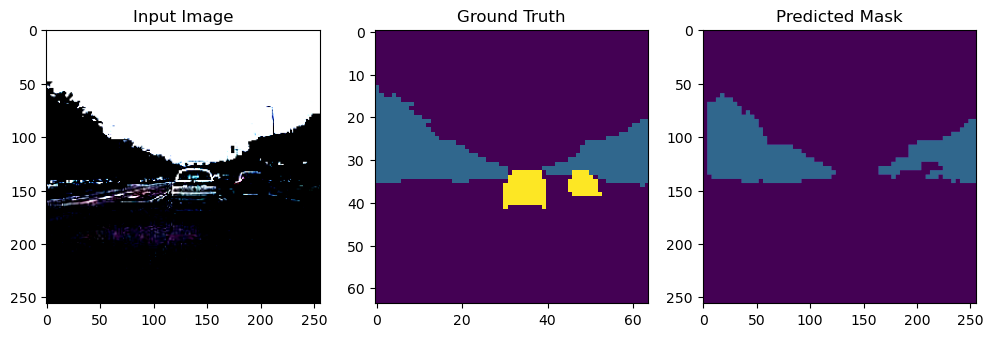

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


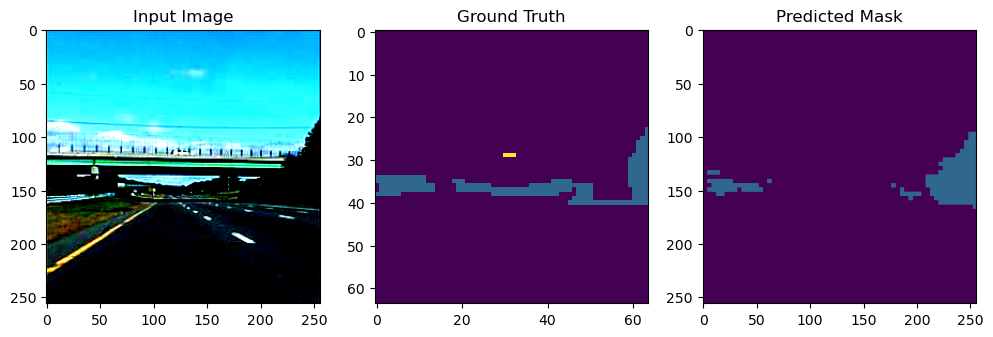

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


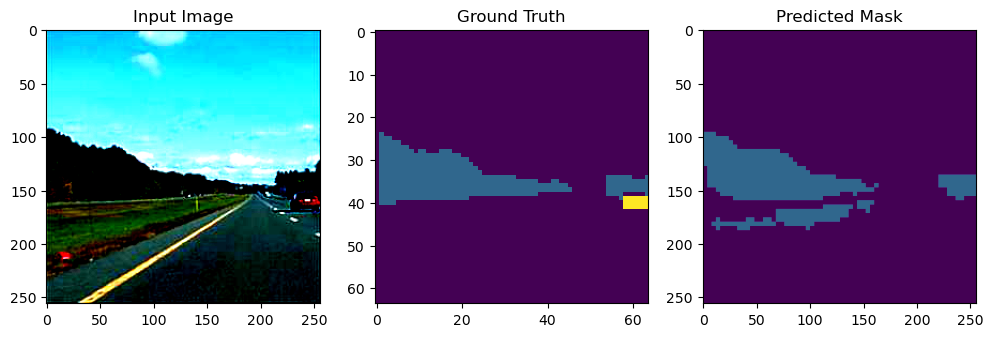

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


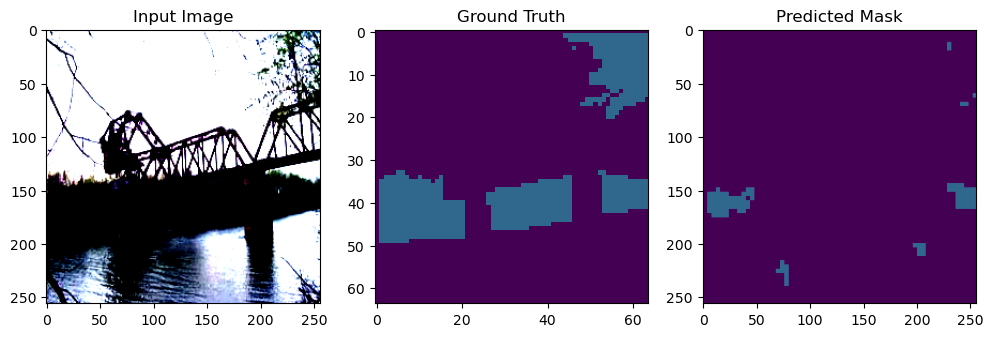

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


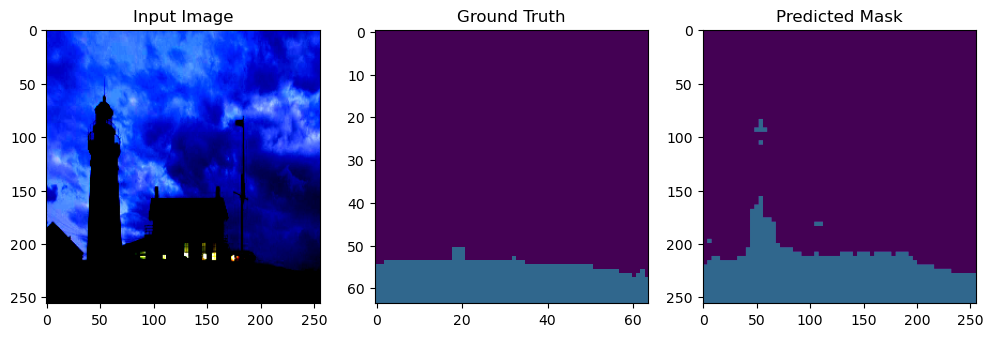

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


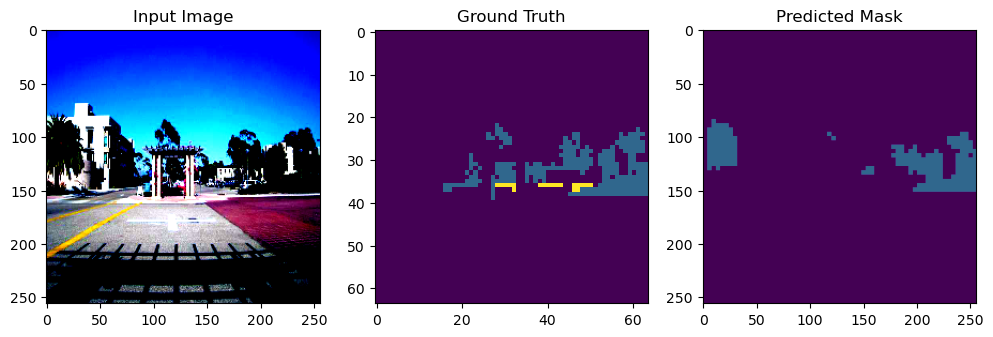

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


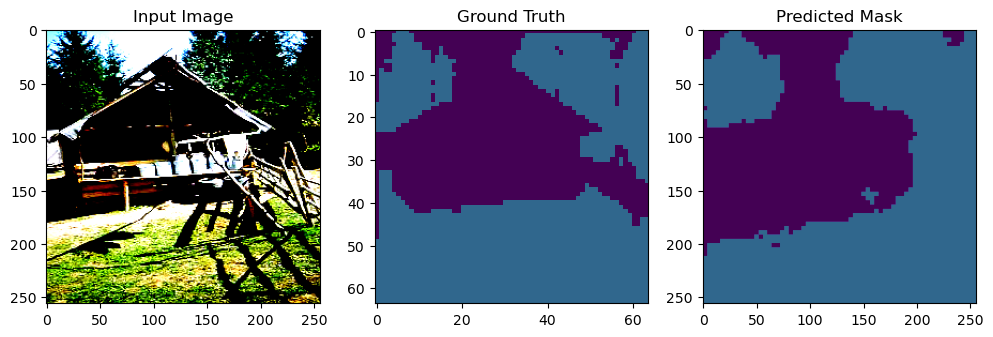

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


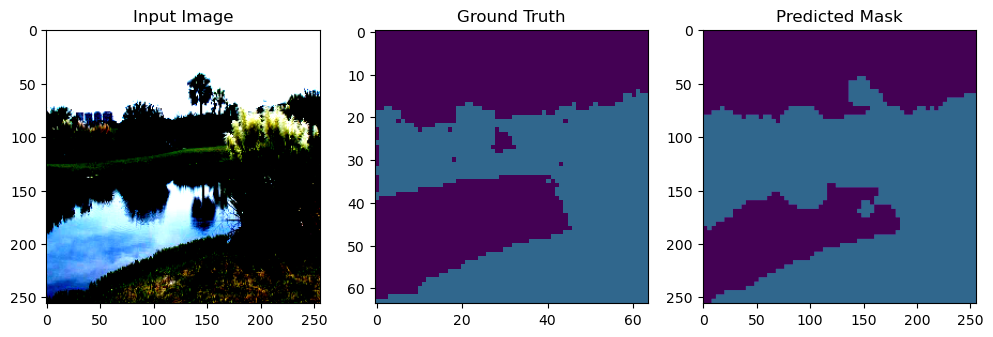

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


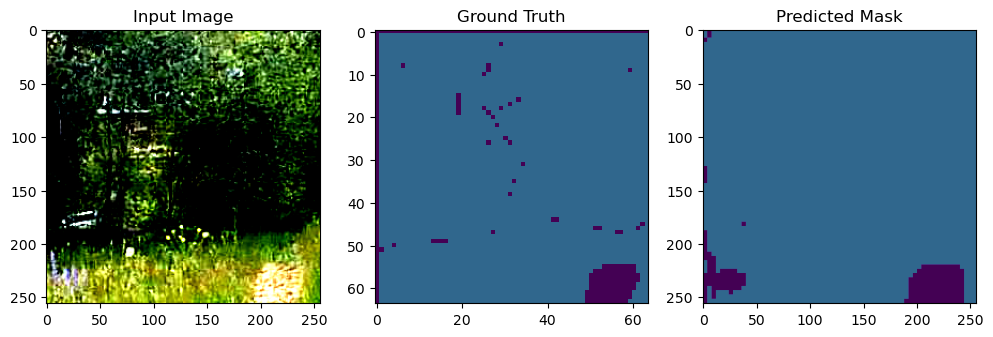

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


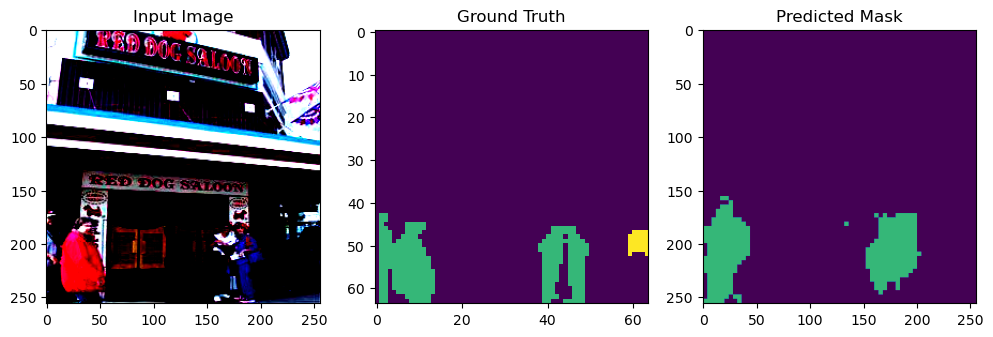

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


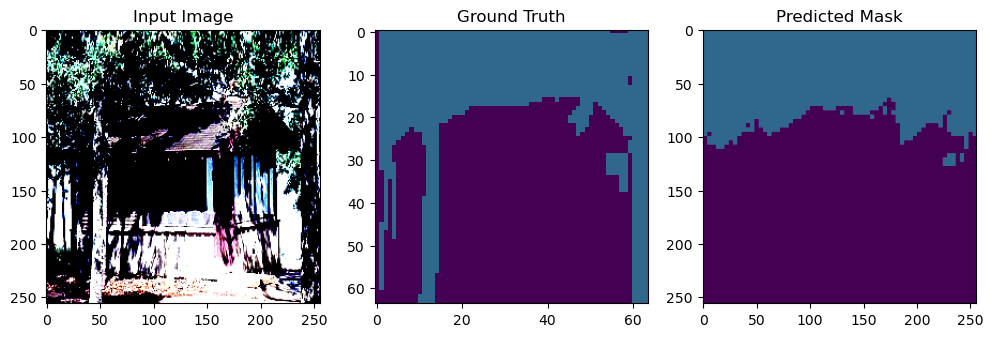

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


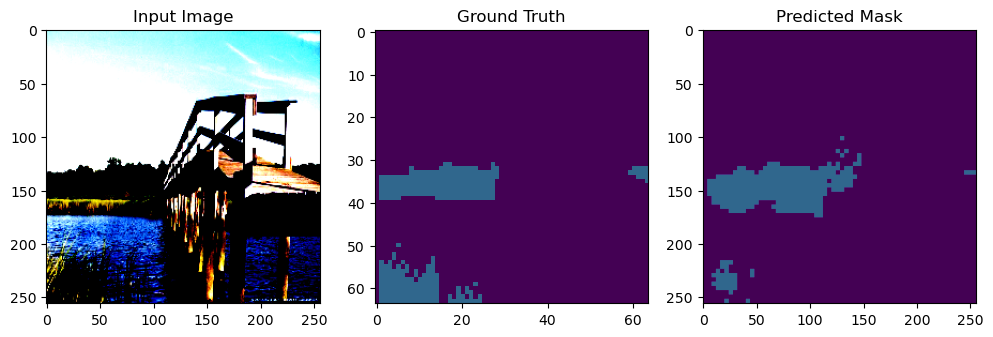

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


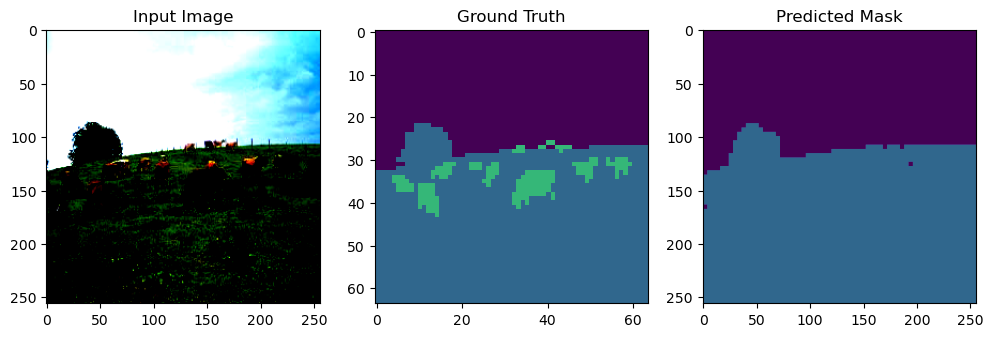

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


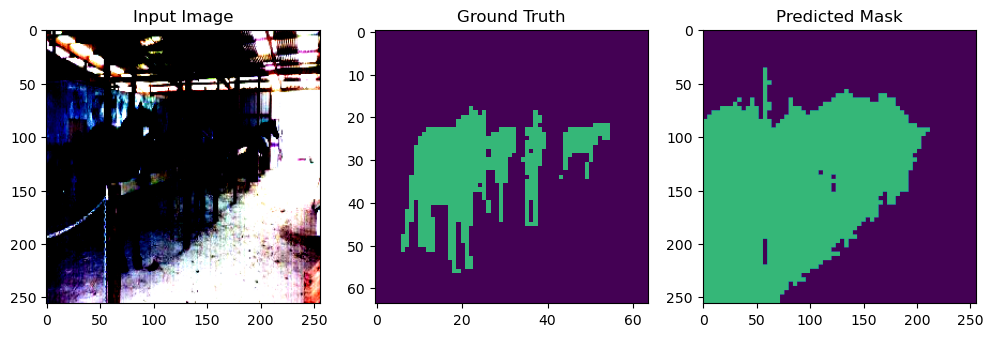

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


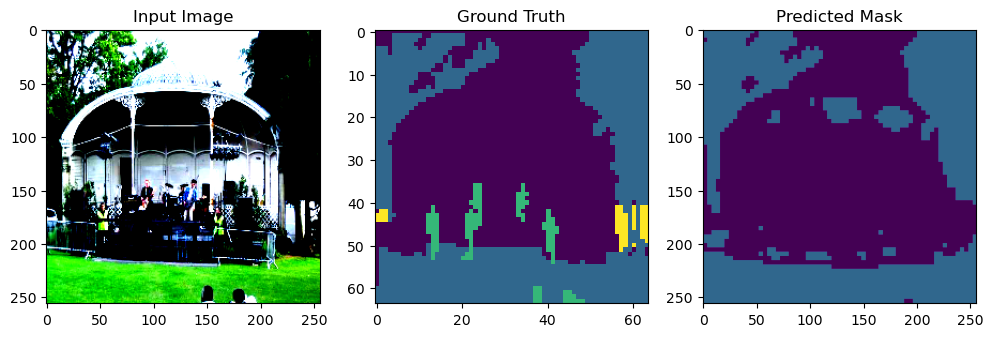

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


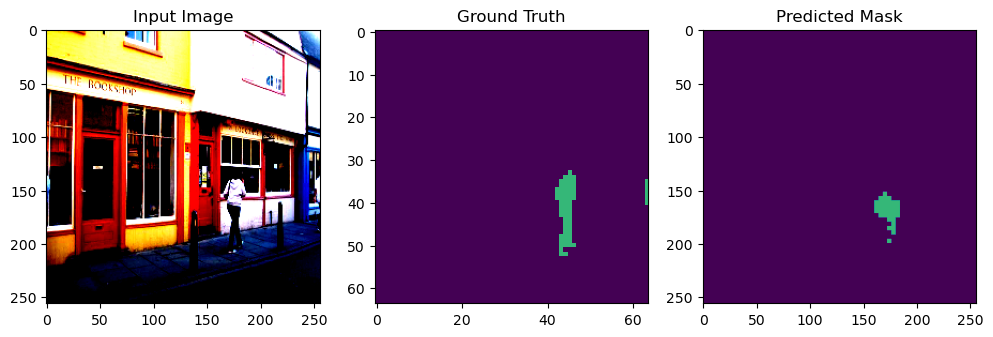

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


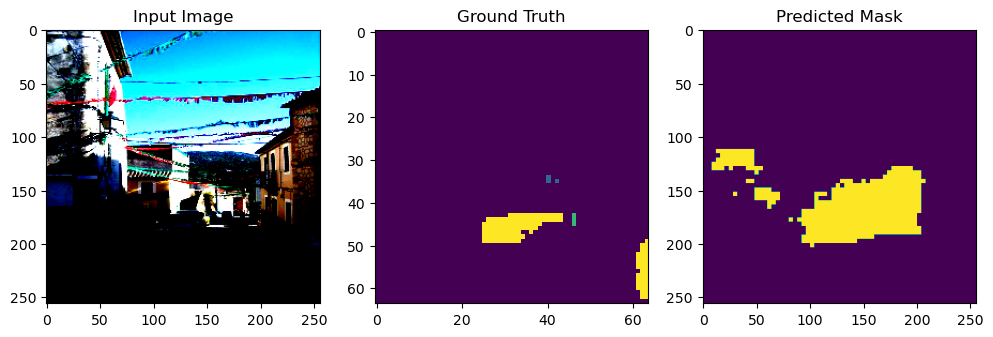

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


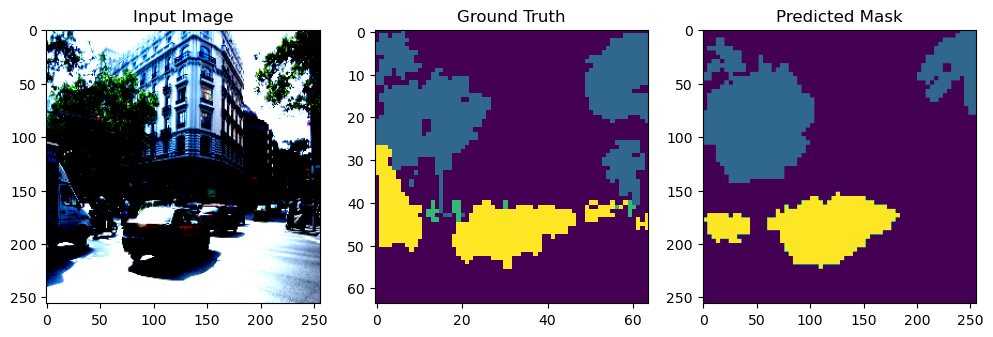

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


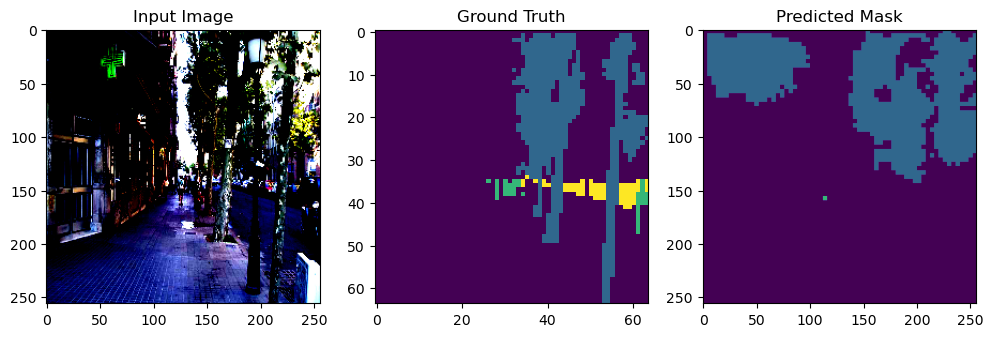

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


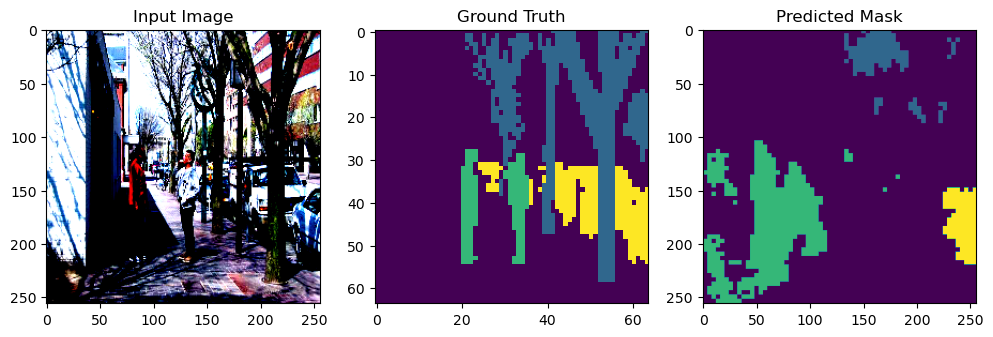

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


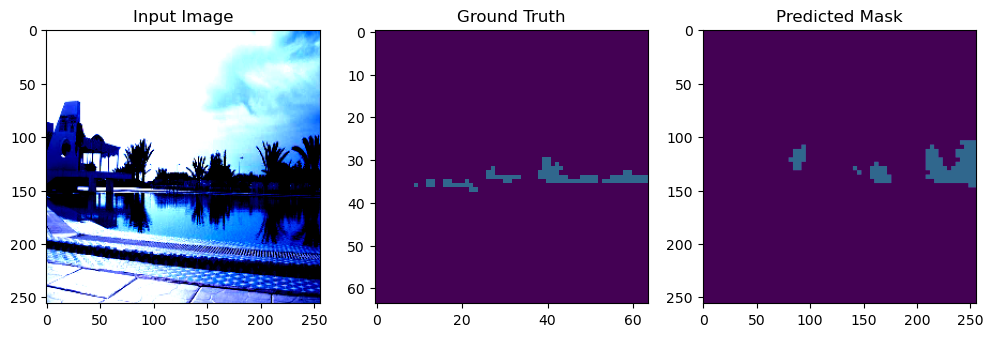

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


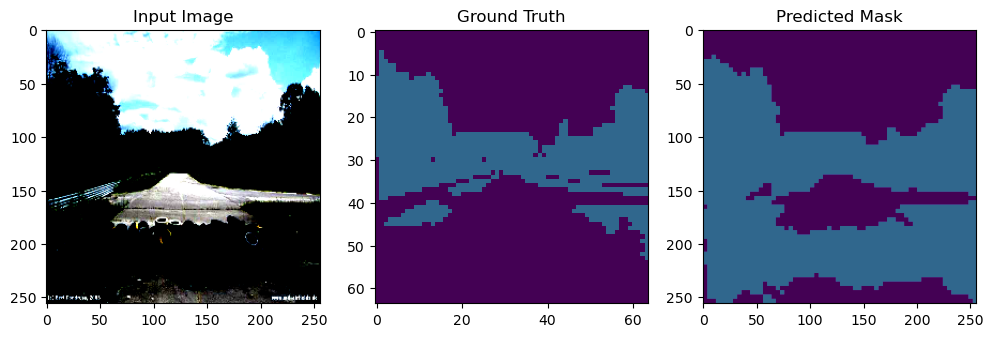

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


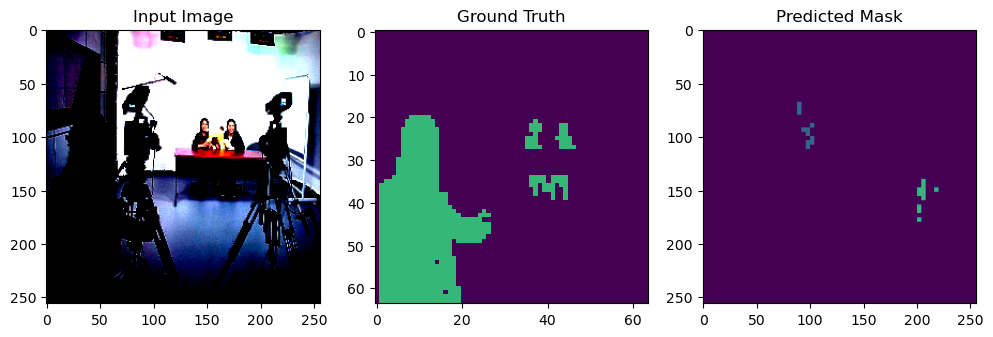

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


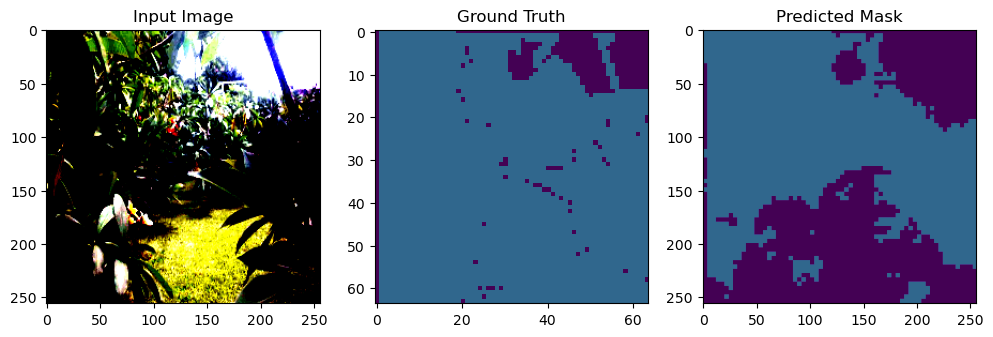

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


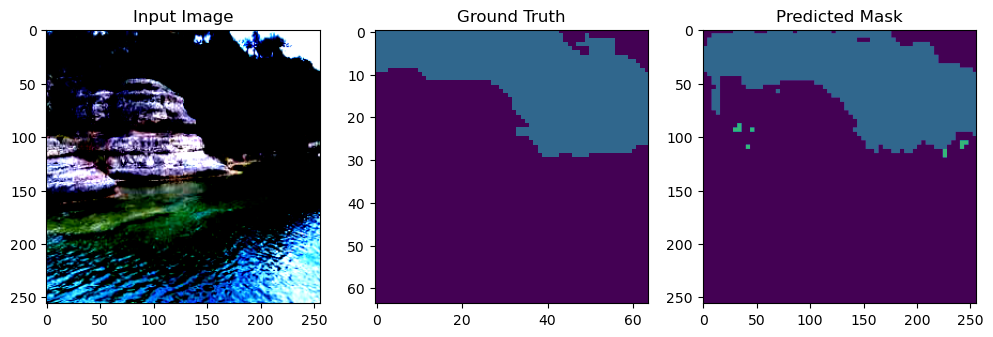

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


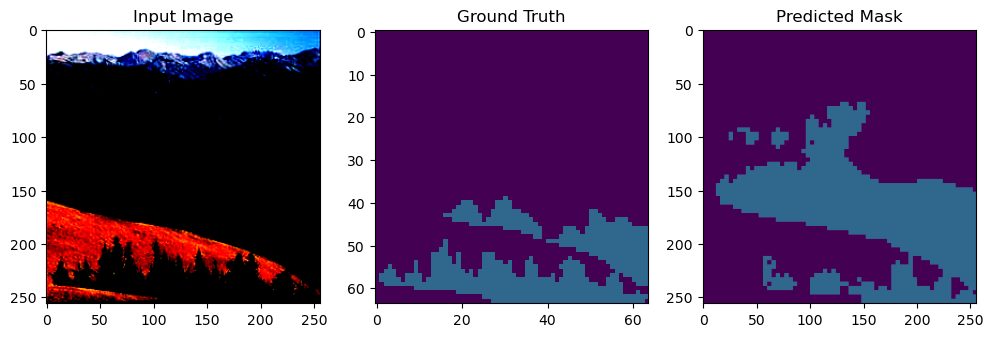

In [56]:
import torchvision.transforms.functional as TF
from PIL import Image
model.eval()
num_classes = 4
original_height, original_width = 256, 256
with torch.no_grad():
    k = 0
    for images, targets in val_loader:
        predictions = model(images)
        #print(predictions)
        predictions = torch.argmax(predictions, dim=1)
        # Upsample predictions 
        predictions_upsampled = F.interpolate(predictions.unsqueeze(1).float(), size=(original_height, original_width), mode='nearest')
        
        
        
        for i in range(min(images.shape[0], 3)):  # Show predictions for the first 3 images
            if(k not in lis):
            

                #print(k)
                plt.figure(figsize=(12, 4))

                plt.subplot(1, 3, 1)
                img_np = images[i].permute(1, 2, 0).numpy()
                plt.imshow(img_np)
                #plt.imshow(TF.to_pil_image(images[i]))
                plt.title('Input Image')

                plt.subplot(1, 3, 2)
                plt.imshow(targets[i], cmap='viridis', vmin=0, vmax=num_classes-1)
                plt.title('Ground Truth')

                plt.subplot(1, 3, 3)
                plt.imshow(predictions_upsampled[i,0], cmap='viridis', vmin=0, vmax=num_classes-1)
                plt.title('Predicted Mask')

                plt.show()
            k = k+1

## Discussion Question
1. Why do we overlap and merge patches when reducing dimensions instead of e.g. max pool?
While max pooling is computationally efficient, it may discard some spatial details. Overlapping and merging patches offer a compromise by preserving more spatial information at the cost of increased computation. Segformer utilizes overlapping and merging patches to strike a balance between capturing global context with transformers and preserving detailed spatial information with convolutional backbones. This design choice is tailored to the specific requirements of semantic segmentation, where understanding both local and global context is crucial for accurate pixel-wise predictions.


2. How does efficient self-attention affect the performance of the model?
The most significant impact of efficient self-attention is on computational efficiency. Efficient self-attention allows models to scale to longer input sequences without a significant increase in computational requirements. The reduced computational complexity of efficient self-attention often leads to faster training times.


3. Why do we only have one activation function in MixFFN?
Training neural networks with multiple activation functions in the same layer can introduce challenges in terms of optimization stability. Different activation functions might have different gradients, and coordinating the learning of weights for each activation function can be more complex.


4. If we removed padding='same' in MixFFN, would the performance of our model be affected? Why or why not? Suppose that there are no dimensional issues caused by this.
Yes, it will be affected.
With "padding='same'", the convolution operation covers the entire input, ensuring that the spatial information at the edges of the input is fully considered. Without padding, the convolution operation may lose information at the borders of the input. Removing padding might introduce edge effects where the convolution operation at the edges of the input has incomplete context. This might result in a reduced ability to capture spatial patterns accurately, especially for features near the image borders, causing inaccurate segmentation results near the edges. 


5. What is the difference between cross-entropy loss and miou? Why do we not use the miou to train?
Cross-entropy measures the dissimilarity between the predicted probability distribution and the true distribution of class labels at each pixel. Miou measures the overlap between the predicted segmentation and the ground truth segmentation for each class. mIoU provides a more comprehensive measure of segmentation performance, taking into account both the true positive and false positive predictions. While mIoU is a valuable metric for evaluating the final segmentation performance, optimizing directly for mIoU during training might not always lead to optimal results. Cross-entropy loss focuses on the pixel-wise prediction accuracy, which is crucial for training a segmentation model effectively.
mIoU is not a differentiable metric, which makes it challenging to use directly as a loss function during training. During the training process, the model needs a differentiable loss function to compute gradients and update its parameters through backpropagation. Cross-entropy loss is used for this purpose. 


6. Why are transformers especially suitable for this architecture? Namely, passing through different feature map stages and using a very small decoder. What problems might arise if we used convolutions instead?
Transformers are particularly suitable for architectures like Segformer due to their ability to capture global context, handle variable context sizes, and adapt to different scales effectively. In the context of image segmentation, capturing global context is essential for understanding the relationships between different parts of an image. The self-attention mechanism in transformers allows each position in the sequence to attend to all other positions, enabling the model to capture relationships between pixels across the entire image. 


7. Do you think that adding an FPN makes sense for this architecture? Justify your answer.
No. FPN is useful for capturing features at multiple scales and also for capturing global context. But, the given architecture already does that, so adding FPN does not make sense. FPN will make the model more complex, and it does not also improve the performance much.


8. Your achieved performance is likely not very high, considering the simplicity of the data set. This assignment makes several simplications to the training process that contribute to this. Choose two such simplifications and explain why they degrade the achieved performance.
One simplification is that we skipped data augmentation. Limited data augmentation can lead to overfitting, where the model becomes too specialized in recognizing patterns present in the training data. It may fail to adapt to variations in lighting conditions, orientations, and other factors present in unseen data. Diverse data augmentation helps the model learn more robust features that generalize better. Another simplification is that we have used fixed learning rate. A fixed learning rate may result in suboptimal convergence. In the initial stages of training, a higher learning rate can help the model explore the parameter space more rapidly, while a lower learning rate towards the end can fine-tune the model for better performance. A dynamic learning rate schedule can enhance convergence speed and model accuracy by adjusting the learning rate based on the training progress.
